# Consensus Refinement — **боковые камеры** (side canonical)

Копия `consensus_training.ipynb`. `left_fwd` и `right_bwd` отражаются по горизонтали.
Веса: `checkpoints_consensus_side/consensus_unet_side_best.pt` — не трогают front/rear.

---

# Consensus Refinement — обучение модели для свёртки геометрического консенсуса

Задача: на вход даны **разреженный** raw-warp (геометрический консенсус всех ракурсов),
карта **coverage** (где warp валиден), **depth** в target-системе, **mean(t0,t1)**,
и **static_far** (предзаполненные небо/дальние), плюс опциональная **artifact_mask**.

Выход — RGB target-кадр. Лосс — MSE (под PSNR-метрику).

Ключевое отличие от предыдущего пайплайна (RIFE refinement):
- **Нет RIFE на входе** — чтобы не наследовать его ошибки.
- **PartialConv** в энкодере — корректно сворачивает разреженный warp
  (модель не должна путать "0=чёрный" с "0=нет данных").
- **Базовая инициализация** для residual: где coverage высокий — warp, где
  только static_far валиден — static_far, иначе модель восполняет с нуля.
- Две архитектуры на сравнение: `ConsensusUNet` (Partial U-Net) и `ConsensusMARNet`
  (SPADE-модуляция признаков по coverage/depth/artifact).

## 1. Imports

In [1]:
import os
import sys
import json
import math
import copy
import random
import re
from pathlib import Path
from dataclasses import dataclass, field
from typing import List, Tuple, Optional, Dict

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
from PIL import Image

import matplotlib.pyplot as plt

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {DEVICE}")
if DEVICE.type == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

Device: cuda
GPU: NVIDIA GeForce RTX 4060 Ti
Memory: 17.2 GB


## 2. CONFIG

In [2]:
CV_ROOT = Path(r"C:/Users/adel/Downloads/cv_dataset")

# Windows + Jupyter: DataLoader workers часто падают (cv2/np.load в subprocess)
_DEFAULT_NUM_WORKERS = 0 if sys.platform == "win32" else 4

@dataclass
class Config:
    # === Данные (готовые артефакты на диске) ===
    dataset_root: str = str(CV_ROOT / "final_dataset_v5_participants/train")
    consensus_root: str = str(CV_ROOT / "multiview_warps/train")
    baked_root: str = str(CV_ROOT / "rife_refinement_baked/train")
    rife_root: str = str(CV_ROOT / "rife_predictions_v5/train")
    static_far_root: str = str(CV_ROOT / "precomputed_static_far")  # 766/1278, опционально
    ego_masks_root: str = str(
        Path(r"C:/Users/adel/Documents/GitHub/YA-/methods_gallery/_ego_manual_masks/masks_approved")
    )

    consensus_file: str = "consensus_raw.npy"   # готовый из multiview_warps (1278 шт.)
    use_static_far: bool = False
    use_artifact_mask: bool = True
    use_anchor_frames: bool = True              # mean(t0,t1) на вход
    allowed_cameras: tuple = ("left_fwd", "right_fwd", "left_bwd", "right_bwd")
    mirror_cameras: tuple = ("left_fwd", "right_bwd")  # flip H → канон. перспектива
    augment_random_hflip: bool = False          # не ломать канонизацию side
    max_samples: int = 0

    image_h: int = 544
    image_w: int = 1024

    # === Разделение train/val ===
    val_fraction: float = 0.16

    # === Тренировка ===
    patch_size: int = 256
    batch_size: int = 16
    num_workers: int = _DEFAULT_NUM_WORKERS

    base_channels: int = 32
    out_channels: int = 3

    # Каналы входа (use_anchor_frames=True):
    #   warp_rgb           3
    #   coverage           1
    #   depth              1
    #   static_far_rgb     3
    #   static_far_mask    1
    #   artifact_mask      1
    #   mean_t0t1_rgb      3   — mean*(1-art), сцена без ego
    in_channels: int = 13

    lr: float = 2e-4
    weight_decay: float = 5e-4
    num_epochs: int = 200
    warmup_epochs: int = 5
    grad_clip: float = 1.0

    # Mixed precision (для 4060 Ti — bf16 безопаснее fp16)
    use_amp: bool = True
    amp_dtype: str = "bf16"

    # === EMA ===
    use_ema: bool = True
    ema_decay: float = 0.9995

    # === Лосс ===
    # Вес пикселей с НИЗКИМ effective_mask. =1.0 — обычный MSE.
    # Поставь >1.0 чтобы модель сильнее училась восполнять дырки.
    loss_weight_hole: float = 1.0
    loss_weight_valid: float = 1.0

    # === Логирование ===
    log_every: int = 50
    val_every: int = 1
    save_dir: str = "./checkpoints_consensus_side"
    checkpoint_tag: str = "consensus_unet_side"  # имя *_best.pt

    seed: int = 42


CFG = Config()
Path(CFG.save_dir).mkdir(parents=True, exist_ok=True)
print("Config OK")
print(f"  dataset:   {CFG.dataset_root}")
print(f"  consensus: {CFG.consensus_root} / {CFG.consensus_file}")
print(f"  depth:     {CFG.baked_root}/<id>/d1.npy")
print(f"  rife:      {CFG.rife_root}/<sample_id>.jpg")
print(f"  static_far: {'ON' if CFG.use_static_far else 'OFF'}  artifact: {'ON' if CFG.use_artifact_mask else 'OFF'}")
print(f"  ego_masks: {CFG.ego_masks_root}")
print(f"  cameras:   {CFG.allowed_cameras}")
print(f"  mirror:    {CFG.mirror_cameras}")
print(f"  ckpt tag:  {CFG.checkpoint_tag}  →  {CFG.save_dir}/{CFG.checkpoint_tag}_best.pt")
print(f"  max_samples: {CFG.max_samples or 'all'}")
print(f"  num_workers: {CFG.num_workers}  (0 на Windows/Jupyter — стабильная загрузка)")

Config OK
  dataset:   C:\Users\adel\Downloads\cv_dataset\final_dataset_v5_participants\train
  consensus: C:\Users\adel\Downloads\cv_dataset\multiview_warps\train / consensus_raw.npy
  depth:     C:\Users\adel\Downloads\cv_dataset\rife_refinement_baked\train/<id>/d1.npy
  rife:      C:\Users\adel\Downloads\cv_dataset\rife_predictions_v5\train/<sample_id>.jpg
  static_far: OFF  artifact: ON
  ego_masks: C:\Users\adel\Documents\GitHub\YA-\methods_gallery\_ego_manual_masks\masks_approved
  cameras:   ('left_fwd', 'right_fwd', 'left_bwd', 'right_bwd')
  mirror:    ('left_fwd', 'right_bwd')
  ckpt tag:  consensus_unet_side  →  ./checkpoints_consensus_side/consensus_unet_side_best.pt
  max_samples: all
  num_workers: 0  (0 на Windows/Jupyter — стабильная загрузка)


## 3. Dataset — загрузка из готовых папок

Сейчас читаем напрямую (без единого `.npz` bake):

| поле модели       | откуда на диске |
|-------------------|-----------------|
| `warp_rgb`        | `multiview_warps/train/<id>/consensus_raw.npy` (CHW float 0..1) |
| `coverage`        | `multiview_warps/train/<id>/coverage.npy` |
| `depth`           | `rife_refinement_baked/train/<id>/d1.npy` (target camera, метры) |
| `target_rgb`      | `final_dataset_v5_participants/train/<id>/target/<cam>.jpg` |
| `mean_t0t1_rgb`   | `(input/t0 + input/t1) / 2` — только среднее |
| `static_far_*`    | `precomputed_static_far/<id>/static_far.npz` — **выключено** |
| `artifact_mask`   | `masks_approved/{vehicle}_{camera}.png` per (vehicle, cam) |
| `mean_t0t1_rgb`   | `(t0+t1)/2 * (1-art)` — mean без зоны ego |

Индекс сэмплов — папки в `rife_refinement_baked/train/` с валидным `meta.json`.

Depth нормализуется per-sample в `[0..1]` по `depth / (depth.max() + eps)`.

**Side canonical:** `left_fwd`, `right_bwd` → horizontal flip всех карт.

In [4]:
EPS = 1e-6
VEHICLE_RE = re.compile(r"_([a-zA-Z]+)_\d+__\d{3}$")

try:
    import cv2
except ImportError:
    cv2 = None


def _parse_vehicle(sample_id: str) -> str | None:
    m = VEHICLE_RE.search(sample_id)
    return m.group(1) if m else None


def _load_ego_mask(cfg, sample_id: str, camera: str, target_hw) -> np.ndarray:
    H, W = target_hw
    if not cfg.use_artifact_mask:
        return np.zeros((H, W), dtype=np.float32)
    vehicle = _parse_vehicle(sample_id)
    if not vehicle:
        return np.zeros((H, W), dtype=np.float32)
    path = Path(cfg.ego_masks_root) / f"{vehicle}_{camera}.png"
    if not path.is_file():
        return np.zeros((H, W), dtype=np.float32)
    m = np.array(Image.open(path).convert("L"))
    m = _resize_hw(m, target_hw, cv2.INTER_NEAREST)
    return (m > 127).astype(np.float32)


def build_base_init(warp, cov, sf_rgb, sf_mask, art_mask, mean_t0t1, use_anchor: bool):
    warp_w = cov[..., None]
    sf_w = sf_mask[..., None] * (1.0 - warp_w)
    base_init = warp * warp_w + sf_rgb * sf_w
    base_mask = np.clip(cov + sf_mask * (1.0 - cov), 0.0, 1.0)
    base_init = base_init * (1.0 - art_mask[..., None])
    base_mask = base_mask * (1.0 - art_mask)
    if use_anchor:
        hole = (1.0 - base_mask)[..., None]
        mean_scene = mean_t0t1 * (1.0 - art_mask[..., None])
        mean_art = mean_t0t1 * art_mask[..., None]
        base_init = base_init + mean_scene * hole + mean_art * art_mask[..., None]
    return base_init, base_mask


def _norm_depth(d: np.ndarray) -> np.ndarray:
    d = d.astype(np.float32)
    valid = np.isfinite(d) & (d > 0)
    if valid.sum() == 0:
        return np.zeros_like(d, dtype=np.float32)
    dmax = float(d[valid].max())
    out = np.zeros_like(d, dtype=np.float32)
    out[valid] = d[valid] / (dmax + EPS)
    return out


def _chw_npy_to_hwc_u8(path: Path) -> np.ndarray:
    arr = np.load(path).astype(np.float32)
    if arr.ndim == 3 and arr.shape[0] == 3:
        arr = np.clip(arr.transpose(1, 2, 0), 0.0, 1.0)
    return (arr * 255.0).astype(np.uint8)


def _resize_hw(img: np.ndarray, target_hw, interp) -> np.ndarray:
    H, W = target_hw
    if img.shape[:2] == (H, W):
        return img
    if cv2 is None:
        raise ImportError("opencv-python нужен для resize карт")
    return cv2.resize(img, (W, H), interpolation=interp)


def _resize_maps(warp_rgb, coverage, depth, target_hw):
    warp_rgb = _resize_hw(warp_rgb, target_hw, cv2.INTER_LINEAR)
    coverage = _resize_hw(coverage, target_hw, cv2.INTER_LINEAR)
    depth = _resize_hw(depth, target_hw, cv2.INTER_NEAREST)
    return warp_rgb, coverage, depth


def _flip_maps_h(warp, cov, depth_n, sf_rgb, sf_mask, art_mask, mean_t0t1, rife, target):
    flip = lambda a: a[:, ::-1].copy()
    return (
        flip(warp), flip(cov), flip(depth_n), flip(sf_rgb), flip(sf_mask),
        flip(art_mask), flip(mean_t0t1), flip(rife), flip(target),
    )


class ConsensusDataset(Dataset):
    def __init__(self, sample_dirs, cfg, patch_size=256, augment=True):
        self.dirs = [Path(p) for p in sample_dirs]
        self.cfg = cfg
        self.patch_size = patch_size
        self.augment = augment

    def __len__(self):
        return len(self.dirs)

    def _load(self, baked_dir: Path) -> dict:
        meta = json.loads((baked_dir / "meta.json").read_text(encoding="utf-8"))
        sid = meta["sample_id"]
        cam = meta["camera"]
        src = Path(meta.get("source_dir", Path(self.cfg.dataset_root) / sid))
        warp_dir = Path(self.cfg.consensus_root) / sid

        warp_rgb = _chw_npy_to_hwc_u8(warp_dir / self.cfg.consensus_file)
        coverage = np.load(warp_dir / "coverage.npy").astype(np.float32)
        depth = np.load(baked_dir / "d1.npy").astype(np.float32)
        depth = np.where(np.isfinite(depth), depth, 0.0).astype(np.float32)
        target_rgb = np.array(Image.open(src / "target" / f"{cam}.jpg").convert("RGB"))

        # Единый размер для батчинга (540..554 x 1024 в датасете → cfg.image_h x image_w)
        target_hw = (self.cfg.image_h, self.cfg.image_w)
        warp_rgb, coverage, depth = _resize_maps(warp_rgb, coverage, depth, target_hw)
        target_rgb = _resize_hw(target_rgb, target_hw, cv2.INTER_LINEAR)

        t0_rgb = np.array(Image.open(src / "input" / "t0" / f"{cam}.jpg").convert("RGB"))
        t1_rgb = np.array(Image.open(src / "input" / "t1" / f"{cam}.jpg").convert("RGB"))
        t0_rgb = _resize_hw(t0_rgb, target_hw, cv2.INTER_LINEAR)
        t1_rgb = _resize_hw(t1_rgb, target_hw, cv2.INTER_LINEAR)
        mean_t0t1_rgb = ((t0_rgb.astype(np.float32) + t1_rgb.astype(np.float32)) * 0.5).astype(np.uint8)

        H, W = target_hw
        sf_rgb = np.zeros((H, W, 3), dtype=np.uint8)
        sf_mask = np.zeros((H, W), dtype=np.float32)
        if self.cfg.use_static_far:
            sf_path = Path(self.cfg.static_far_root) / sid / "static_far.npz"
            if sf_path.is_file():
                z = np.load(sf_path)
                sf_mask = z["static"].astype(np.float32)
                sf_rgb = z["mean_pred"].astype(np.uint8)
                if sf_rgb.shape[:2] != (H, W):
                    sf_rgb, sf_mask, _ = _resize_maps(sf_rgb, sf_mask, sf_mask, (H, W))

        art_mask = _load_ego_mask(self.cfg, sid, cam, target_hw)

        rife_rgb = np.zeros((H, W, 3), dtype=np.uint8)
        rife_path = Path(self.cfg.rife_root) / f"{sid}.jpg"
        if rife_path.is_file():
            rife_rgb = np.array(Image.open(rife_path).convert("RGB"))
            rife_rgb = _resize_hw(rife_rgb, target_hw, cv2.INTER_LINEAR)

        return {
            "camera": cam,
            "warp_rgb": warp_rgb,
            "coverage": coverage,
            "depth": depth,
            "static_far_rgb": sf_rgb,
            "static_far_mask": sf_mask,
            "artifact_mask": art_mask,
            "mean_t0t1_rgb": mean_t0t1_rgb,
            "rife_rgb": rife_rgb,
            "target_rgb": target_rgb,
        }

    def __getitem__(self, idx):
        s = self._load(self.dirs[idx])

        warp = s["warp_rgb"].astype(np.float32) / 255.0
        cov = np.clip(s["coverage"], 0.0, 1.0)
        depth_n = _norm_depth(s["depth"])
        sf_rgb = s["static_far_rgb"].astype(np.float32) / 255.0
        sf_mask = np.clip(s["static_far_mask"], 0.0, 1.0)
        art_mask = np.clip(s["artifact_mask"], 0.0, 1.0)
        mean_t0t1 = s["mean_t0t1_rgb"].astype(np.float32) / 255.0
        rife = s["rife_rgb"].astype(np.float32) / 255.0
        target = s["target_rgb"].astype(np.float32) / 255.0
        cam = s["camera"]
        mirrored = cam in getattr(self.cfg, "mirror_cameras", ())
        if mirrored:
            warp, cov, depth_n, sf_rgb, sf_mask, art_mask, mean_t0t1, rife, target = _flip_maps_h(
                warp, cov, depth_n, sf_rgb, sf_mask, art_mask, mean_t0t1, rife, target
            )

        H, W = warp.shape[:2]

        if self.patch_size and (H > self.patch_size or W > self.patch_size):
            ph = pw = self.patch_size
            y0 = random.randint(0, H - ph)
            x0 = random.randint(0, W - pw)
            sl = (slice(y0, y0 + ph), slice(x0, x0 + pw))
            warp = warp[sl]; cov = cov[sl]; depth_n = depth_n[sl]
            sf_rgb = sf_rgb[sl]; sf_mask = sf_mask[sl]; art_mask = art_mask[sl]
            mean_t0t1 = mean_t0t1[sl]; rife = rife[sl]
            target = target[sl]

        if self.augment:
            if getattr(self.cfg, "augment_random_hflip", True) and random.random() < 0.5:
                warp = warp[:, ::-1].copy(); cov = cov[:, ::-1].copy()
                depth_n = depth_n[:, ::-1].copy()
                sf_rgb = sf_rgb[:, ::-1].copy(); sf_mask = sf_mask[:, ::-1].copy()
                art_mask = art_mask[:, ::-1].copy()
                mean_t0t1 = mean_t0t1[:, ::-1].copy(); rife = rife[:, ::-1].copy()
                target = target[:, ::-1].copy()
            if random.random() < 0.5:
                warp = warp[::-1].copy(); cov = cov[::-1].copy()
                depth_n = depth_n[::-1].copy()
                sf_rgb = sf_rgb[::-1].copy(); sf_mask = sf_mask[::-1].copy()
                art_mask = art_mask[::-1].copy()
                mean_t0t1 = mean_t0t1[::-1].copy(); rife = rife[::-1].copy()
                target = target[::-1].copy()
            k = random.randint(0, 3)
            if k:
                rot = lambda a: np.rot90(a, k).copy()
                warp = rot(warp); cov = rot(cov); depth_n = rot(depth_n)
                sf_rgb = rot(sf_rgb); sf_mask = rot(sf_mask); art_mask = rot(art_mask)
                mean_t0t1 = rot(mean_t0t1); rife = rot(rife)
                target = rot(target)

        warp_w = cov[..., None]
        sf_w = sf_mask[..., None] * (1.0 - warp_w)
        base_init, base_mask = build_base_init(
            warp, cov, sf_rgb, sf_mask, art_mask, mean_t0t1, self.cfg.use_anchor_frames
        )

        mean_in = mean_t0t1 * (1.0 - art_mask[..., None])
        eff_mask = np.ones_like(base_mask) if self.cfg.use_anchor_frames else base_mask

        to_chw_3 = lambda a: torch.from_numpy(a.transpose(2, 0, 1)).contiguous().float()
        to_chw_1 = lambda a: torch.from_numpy(a)[None].contiguous().float()

        parts = [
            to_chw_3(warp),
            to_chw_1(cov),
            to_chw_1(depth_n),
            to_chw_3(sf_rgb),
            to_chw_1(sf_mask),
            to_chw_1(art_mask),
        ]
        if self.cfg.use_anchor_frames:
            parts.append(to_chw_3(mean_in))
        inputs = torch.cat(parts, dim=0)

        return {
            "inputs": inputs,
            "effective_mask": to_chw_1(eff_mask),
            "base_init": to_chw_3(base_init),
            "base_mask": to_chw_1(base_mask),
            "target": to_chw_3(target),
            "mean_raw": to_chw_3(mean_t0t1),
            "rife_rgb": to_chw_3(rife),
            "camera": cam,
            "mirrored": mirrored,
        }


def discover_samples(cfg) -> list[Path]:
    baked_root = Path(cfg.baked_root)
    consensus_root = Path(cfg.consensus_root)
    dataset_root = Path(cfg.dataset_root)
    out: list[Path] = []
    for baked_dir in sorted(baked_root.iterdir()):
        if not baked_dir.is_dir() or not (baked_dir / "meta.json").is_file():
            continue
        meta = json.loads((baked_dir / "meta.json").read_text(encoding="utf-8"))
        sid = meta["sample_id"]
        cam = meta["camera"]
        allowed = getattr(cfg, "allowed_cameras", None)
        if allowed and cam not in allowed:
            continue
        src = Path(meta.get("source_dir", dataset_root / sid))
        warp_dir = consensus_root / sid
        ok = (
            (warp_dir / cfg.consensus_file).is_file()
            and (warp_dir / "coverage.npy").is_file()
            and (baked_dir / "d1.npy").is_file()
            and (src / "target" / f"{cam}.jpg").is_file()
            and (src / "input" / "t0" / f"{cam}.jpg").is_file()
            and (src / "input" / "t1" / f"{cam}.jpg").is_file()
        )
        if ok:
            out.append(baked_dir)
    if cfg.max_samples > 0 and len(out) > cfg.max_samples:
        rng = np.random.RandomState(cfg.seed)
        idx = np.arange(len(out))
        rng.shuffle(idx)
        out = [out[i] for i in idx[: cfg.max_samples]]
    return out


ALL_SAMPLES = discover_samples(CFG)
print(f"Готово к обучению: {len(ALL_SAMPLES)} сэмплов (cameras={CFG.allowed_cameras})")
if ALL_SAMPLES:
    n_art = 0
    for p in ALL_SAMPLES:
        meta = json.loads((p / "meta.json").read_text(encoding="utf-8"))
        m = _load_ego_mask(CFG, meta["sample_id"], meta["camera"], (CFG.image_h, CFG.image_w))
        if m.sum() > 32:
            n_art += 1
    print(f"  с ego-маской (>32 px): {n_art}/{len(ALL_SAMPLES)}")
if ALL_SAMPLES:
    ds = ConsensusDataset(ALL_SAMPLES[:4], CFG, patch_size=CFG.patch_size, augment=True)
    b = ds[0]
    for k, v in b.items():
        if isinstance(v, torch.Tensor):
            print(f"  {k}: {tuple(v.shape)} {v.dtype} [{v.min():.3f}..{v.max():.3f}]")
        else:
            print(f"  {k}: {v} (type: {type(v).__name__})")

Готово к обучению: 829 сэмплов (cameras=('left_fwd', 'right_fwd', 'left_bwd', 'right_bwd'))


  с ego-маской (>32 px): 824/829
  inputs: (13, 256, 256) torch.float32 [0.000..1.000]
  effective_mask: (1, 256, 256) torch.float32 [1.000..1.000]
  base_init: (3, 256, 256) torch.float32 [0.027..1.000]
  base_mask: (1, 256, 256) torch.float32 [0.000..1.000]
  target: (3, 256, 256) torch.float32 [0.047..1.000]
  mean_raw: (3, 256, 256) torch.float32 [0.165..1.000]
  rife_rgb: (3, 256, 256) torch.float32 [0.161..1.000]
  camera: right_fwd (type: str)
  mirrored: False (type: bool)


### 3.1 Debug: base_init и ego-маска

Проверка склейки до обучения: GT, warp, coverage, mean, overlay маски, `mean*(1-art)`, `mean*art`, `base_init`, `base_mask`.

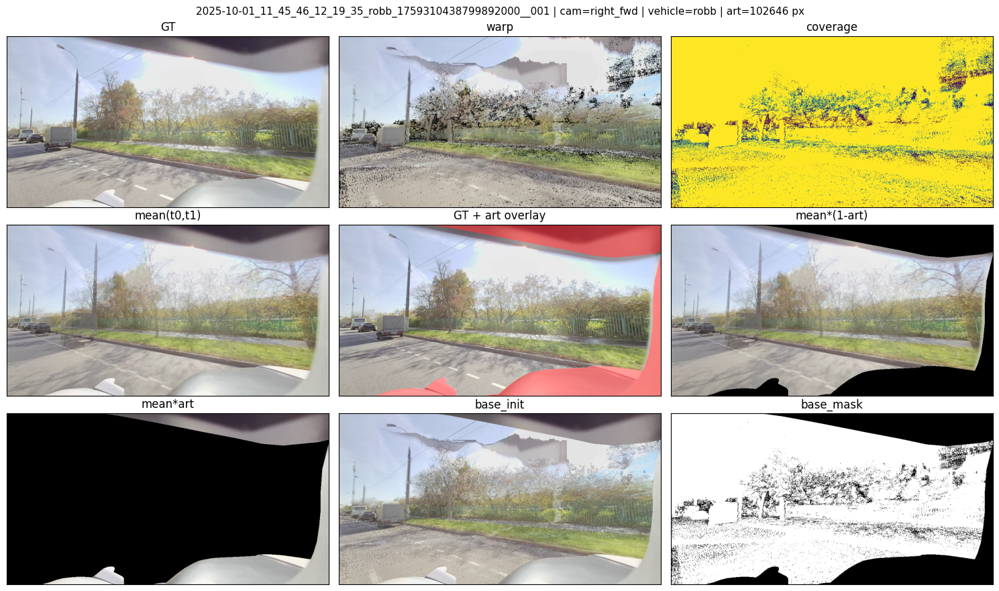

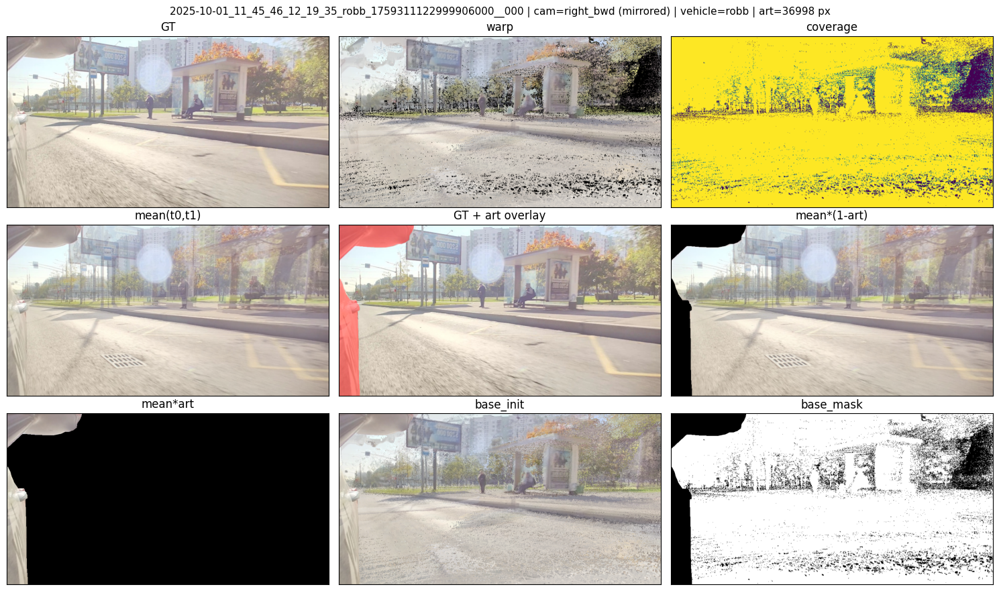

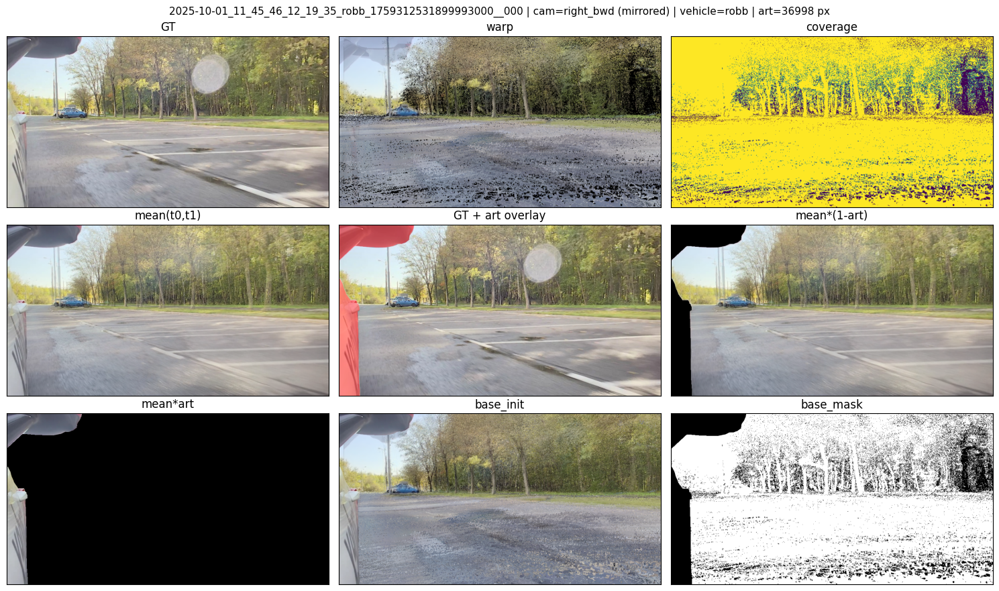

In [5]:
def _pick_stitch_samples(samples, cfg, k=3):
    with_art, without = [], []
    for p in samples:
        meta = json.loads((p / "meta.json").read_text(encoding="utf-8"))
        m = _load_ego_mask(cfg, meta["sample_id"], meta["camera"], (cfg.image_h, cfg.image_w))
        (with_art if m.sum() > 32 else without).append(p)
    picks = with_art[:k]
    if len(picks) < k:
        picks += without[: max(0, k - len(picks))]
    return picks


def visualize_stitching(baked_dir, cfg, use_anchor=None):
    use_anchor = cfg.use_anchor_frames if use_anchor is None else use_anchor
    baked_dir = Path(baked_dir)
    raw = ConsensusDataset([baked_dir], cfg, patch_size=cfg.patch_size, augment=False)._load(baked_dir)
    cam = raw["camera"]
    mirrored = cam in getattr(cfg, "mirror_cameras", ())

    warp = raw["warp_rgb"].astype(np.float32) / 255.0
    cov = raw["coverage"]
    sf_rgb = raw["static_far_rgb"].astype(np.float32) / 255.0
    sf_mask = raw["static_far_mask"]
    art = raw["artifact_mask"]
    mean = raw["mean_t0t1_rgb"].astype(np.float32) / 255.0
    target = raw["target_rgb"].astype(np.float32) / 255.0
    if mirrored:
        flip = lambda a: a[:, ::-1].copy()
        warp, cov, sf_rgb, sf_mask, art, mean, target = (
            flip(warp), flip(cov), flip(sf_rgb), flip(sf_mask), flip(art), flip(mean), flip(target)
        )

    mean_in = mean * (1.0 - art[..., None])
    mean_art = mean * art[..., None]
    base_init, base_mask = build_base_init(warp, cov, sf_rgb, sf_mask, art, mean, use_anchor)

    overlay = target * (1.0 - art[..., None] * 0.45)
    overlay = overlay + np.array([1.0, 0.15, 0.15], dtype=np.float32) * (art[..., None] * 0.55)

    meta = json.loads((baked_dir / "meta.json").read_text(encoding="utf-8"))
    vehicle = _parse_vehicle(meta["sample_id"]) or "?"
    fig, axes = plt.subplots(3, 3, figsize=(15, 9))
    fig.suptitle(
        f"{meta['sample_id']} | cam={meta['camera']}{' (mirrored)' if mirrored else ''} | "
        f"vehicle={vehicle} | art={int(art.sum())} px",
        fontsize=11,
    )

    panels = [
        (target, "GT"),
        (warp, "warp"),
        (cov, "coverage", "viridis"),
        (mean, "mean(t0,t1)"),
        (overlay, "GT + art overlay"),
        (mean_in, "mean*(1-art)"),
        (mean_art, "mean*art"),
        (base_init, "base_init"),
        (base_mask, "base_mask", "gray"),
    ]
    for ax, item in zip(axes.flat, panels):
        img, title = item[0], item[1]
        cmap = item[2] if len(item) > 2 else None
        if img.ndim == 2:
            ax.imshow(img, cmap=cmap or "gray", vmin=0, vmax=1)
        else:
            ax.imshow(np.clip(img, 0, 1))
        ax.set_title(title)
        ax.set_xticks([]); ax.set_yticks([])
    plt.tight_layout()
    plt.show()


for p in _pick_stitch_samples(ALL_SAMPLES, CFG, k=3):
    visualize_stitching(p, CFG)

## 4. PartialConv2d — корректная свёртка разреженного входа

Идея (Liu et al. 2018, *Image Inpainting for Irregular Holes*):
- Свёртка работает только над **валидными** пикселями (`x * mask`).
- Результат **нормализуется** на отношение `slide_winsize / valid_in_window`,
  чтобы значения не "разбавлялись" нулями.
- Маска обновляется: если в окне был хоть один валидный пиксель → выход валиден.

После 2-3 PartialConv-блоков с downsampling маска обычно полностью заполняется,
и дальше можно работать обычными свёртками. Поэтому PartialConv ставим только в
**энкодере**, декодер — стандартный U-Net.

In [6]:
class PartialConv2d(nn.Conv2d):
    # Partial Convolution с явным трекингом маски валидности.
    def __init__(self, in_ch, out_ch, kernel_size, stride=1, padding=0,
                 dilation=1, bias=True):
        super().__init__(in_ch, out_ch, kernel_size, stride=stride,
                         padding=padding, dilation=dilation, bias=bias)
        ker = self.kernel_size
        mask_ker = torch.ones(1, 1, ker[0], ker[1])
        self.register_buffer("mask_kernel", mask_ker)
        # размер окна (для нормализации)
        self.slide_winsize = float(ker[0] * ker[1])

    def forward(self, x, mask):
        # mask: [B, 1, H, W]
        with torch.no_grad():
            updated_mask = F.conv2d(
                mask, self.mask_kernel, bias=None,
                stride=self.stride, padding=self.padding, dilation=self.dilation,
            )
            mask_ratio = self.slide_winsize / (updated_mask + 1e-8)
            updated_mask = torch.clamp(updated_mask, 0.0, 1.0)
            mask_ratio = mask_ratio * updated_mask

        x_masked = x * mask  # broadcast: mask=[B,1,H,W] на x=[B,C,H,W]
        out = F.conv2d(x_masked, self.weight, bias=None,
                       stride=self.stride, padding=self.padding,
                       dilation=self.dilation)
        if self.bias is not None:
            bias = self.bias.view(1, -1, 1, 1)
            out = (out - bias) * mask_ratio + bias
            out = out * updated_mask
        else:
            out = out * mask_ratio
        return out, updated_mask


class PartialDoubleConv(nn.Module):
    # Два PartialConv 3x3 подряд + GELU (аналог ConvBlock).
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.pc1 = PartialConv2d(in_ch, out_ch, 3, padding=1)
        self.pc2 = PartialConv2d(out_ch, out_ch, 3, padding=1)
        self.act = nn.GELU()

    def forward(self, x, mask):
        x, mask = self.pc1(x, mask)
        x = self.act(x)
        x, mask = self.pc2(x, mask)
        x = self.act(x)
        return x, mask


def _pconv_sanity():
    pc = PartialConv2d(3, 16, 3, padding=1)
    x = torch.randn(2, 3, 32, 32)
    # маска с большой "дырой" посередине
    m = torch.ones(2, 1, 32, 32)
    m[:, :, 10:22, 10:22] = 0.0
    y, m2 = pc(x, m)
    leak = (m2[:, :, 10:22, 10:22] > 0).float().mean().item()
    print(f"PartialConv OK: out={tuple(y.shape)}, mask leak in hole={leak:.2%}")

_pconv_sanity()

PartialConv OK: out=(2, 16, 32, 32), mask leak in hole=30.56%


## 5. ConsensusUNet — Partial-encoder + стандартный декодер

Архитектура:
1. На вход — `[B, 13, H, W]` (warp + meta + mean(t0,t1)) + `effective_mask` `[B, 1, H, W]`.
2. **Encoder** (4 уровня) — `PartialDoubleConv`, маска проходит вниз и заполняется.
3. **Bottleneck** — обычный `ConvBlock` (маска к этому моменту почти везде = 1).
4. **Decoder** — обычные `ConvBlock` со skip-connections; на каждом уровне
   передаём также **upsampled mask** конкатом, чтобы декодер знал, где источник
   был сильнее.
5. **Head** — residual (zero-init) поверх `base_init`. На старте обучения
   `pred ≈ base_init`, идентичный warp/static_far бейзлайн.

Дополнительно — `confidence_head` (sigmoid), который можно использовать для
weighted-loss или визуализации, но в loss не идёт по умолчанию.

In [7]:
class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.GELU(),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.GELU(),
        )
    def forward(self, x):
        return self.block(x)


class ConsensusUNet(nn.Module):
    def __init__(self, in_ch=13, base=32, predict_confidence=True):
        super().__init__()
        self.predict_confidence = predict_confidence

        # Partial Encoder (4 уровня)
        self.penc1 = PartialDoubleConv(in_ch, base)
        self.penc2 = PartialDoubleConv(base, base * 2)
        self.penc3 = PartialDoubleConv(base * 2, base * 4)
        self.penc4 = PartialDoubleConv(base * 4, base * 8)

        # Bottleneck — обычная свёртка (маска уже плотная)
        self.bottleneck = ConvBlock(base * 8, base * 8)

        # Decoder: +1 канал на каждом уровне — это upsampled mask с этого уровня
        self.dec4 = ConvBlock(base * 8 + base * 8 + 1, base * 4)
        self.dec3 = ConvBlock(base * 4 + base * 4 + 1, base * 2)
        self.dec2 = ConvBlock(base * 2 + base * 2 + 1, base)
        self.dec1 = ConvBlock(base     + base     + 1, base)

        # Residual head (zero-init → identity start)
        self.out_residual = nn.Conv2d(base, 3, 3, padding=1)
        nn.init.zeros_(self.out_residual.weight)
        nn.init.zeros_(self.out_residual.bias)

        if predict_confidence:
            self.out_conf = nn.Conv2d(base, 1, 3, padding=1)
            nn.init.zeros_(self.out_conf.weight)
            nn.init.zeros_(self.out_conf.bias)

        self.pool = nn.MaxPool2d(2)
        self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False)

    def _pool_with_mask(self, x, m):
        # признаки усредняем, маску — max (есть хоть один валидный)
        x_d = F.avg_pool2d(x, 2)
        m_d = F.max_pool2d(m, 2)
        return x_d, m_d

    def forward(self, x, eff_mask, base_init):
        # x:         [B, in_ch, H, W]
        # eff_mask:  [B, 1, H, W]
        # base_init: [B, 3, H, W]

        # Partial encoder
        e1, m1 = self.penc1(x, eff_mask)
        x2, m2 = self._pool_with_mask(e1, m1)
        e2, m2 = self.penc2(x2, m2)
        x3, m3 = self._pool_with_mask(e2, m2)
        e3, m3 = self.penc3(x3, m3)
        x4, m4 = self._pool_with_mask(e3, m3)
        e4, m4 = self.penc4(x4, m4)
        xb, mb = self._pool_with_mask(e4, m4)

        b = self.bottleneck(xb)

        d4 = self.dec4(torch.cat([self.up(b),  e4, m4], dim=1))
        d3 = self.dec3(torch.cat([self.up(d4), e3, m3], dim=1))
        d2 = self.dec2(torch.cat([self.up(d3), e2, m2], dim=1))
        d1 = self.dec1(torch.cat([self.up(d2), e1, m1], dim=1))

        residual = self.out_residual(d1)
        pred = (base_init + residual).clamp(0.0, 1.0)

        out = {"pred": pred, "residual": residual}
        if self.predict_confidence:
            out["confidence"] = torch.sigmoid(self.out_conf(d1))
        return out


def consensus_unet_sanity():
    m = ConsensusUNet(in_ch=CFG.in_channels, base=CFG.base_channels)
    x = torch.randn(2, CFG.in_channels, 256, 256)
    mask = (torch.rand(2, 1, 256, 256) > 0.2).float()
    base = torch.rand(2, 3, 256, 256)
    out = m(x, mask, base)
    n_params = sum(p.numel() for p in m.parameters())
    print(f"ConsensusUNet параметров: {n_params/1e6:.2f}M")
    print(f"  pred:       {tuple(out['pred'].shape)}")
    print(f"  residual:   {tuple(out['residual'].shape)}")
    if 'confidence' in out:
        print(f"  confidence: {tuple(out['confidence'].shape)}  mean={out['confidence'].mean():.3f}")
    diff = (out['pred'] - base.clamp(0, 1)).abs().max().item()
    print(f"  |pred - base|_max при zero-init: {diff:.6f}  (должно быть ~0)")

consensus_unet_sanity()

ConsensusUNet параметров: 3.35M
  pred:       (2, 3, 256, 256)
  residual:   (2, 3, 256, 256)
  confidence: (2, 1, 256, 256)  mean=0.500
  |pred - base|_max при zero-init: 0.000000  (должно быть ~0)


## 6. Метрика, лосс, EMA

In [8]:
@torch.no_grad()
def psnr_uint8(pred, gt):
    # PSNR по uint8 — как при реальной оценке
    pred_u8 = (pred.clamp(0, 1) * 255.0).round()
    gt_u8   = (gt.clamp(0, 1)   * 255.0).round()
    mse = ((pred_u8 - gt_u8) ** 2).mean().item()
    if mse < 1e-10:
        return 99.0
    return 20.0 * math.log10(255.0 / math.sqrt(mse))


@torch.no_grad()
def psnr_uint8_region(pred, gt, region_mask, min_pixels=256):
    """PSNR только по пикселям region_mask > 0.5 (напр. сцена без ego)."""
    m = region_mask > 0.5
    if m.dim() == 3:
        m = m.unsqueeze(1)
    if int(m.sum()) < min_pixels:
        return float("nan")
    pred_u8 = (pred.clamp(0, 1) * 255.0).round()
    gt_u8 = (gt.clamp(0, 1) * 255.0).round()
    m3 = m.expand_as(pred_u8)
    mse = ((pred_u8 - gt_u8)[m3] ** 2).mean().item()
    if mse < 1e-10:
        return 99.0
    return 20.0 * math.log10(255.0 / math.sqrt(mse))


@torch.no_grad()
def psnr_float(pred, gt):
    mse = ((pred - gt) ** 2).mean().item()
    if mse < 1e-10:
        return 99.0
    return 20.0 * math.log10(1.0 / math.sqrt(mse))


def consensus_loss(pred, gt, eff_mask, w_valid=1.0, w_hole=1.0):
    # Взвешенный MSE по effective_mask.
    # w_valid — вес для пикселей с данными (mask=1)
    # w_hole  — вес для дырок (mask=0)
    sq = (pred - gt) ** 2
    w = w_valid * eff_mask + w_hole * (1.0 - eff_mask)
    return (sq * w).mean()


class ModelEMA:
    def __init__(self, model, decay=0.9995):
        self.decay = decay
        self.module = copy.deepcopy(model).eval()
        for p in self.module.parameters():
            p.requires_grad_(False)

    @torch.no_grad()
    def update(self, model):
        d = self.decay
        for ep, p in zip(self.module.parameters(), model.parameters()):
            ep.data.mul_(d).add_(p.data, alpha=1 - d)
        for eb, b in zip(self.module.buffers(), model.buffers()):
            eb.data.copy_(b.data)

## 7. Бейзлайны без модели — PSNR от warp / RIFE / mean / base_init

Полезно знать, насколько модель должна что-то добавить, прежде чем
запускать длинное обучение.

**Почему `mean_masked` ниже, чем раньше:** в baseline раньше считался канал
`inputs[10:13]`, а теперь это **`mean*(1-art)`** — в зоне капота/зеркал нули,
и full-frame PSNR к GT падает. Для честного сравнения с прошлым смотри
`mean_t0t1_raw` — сырой `(t0+t1)/2` по всему кадру.

In [9]:
@torch.no_grad()
def measure_baselines(loader, device):
    warp_psnrs, base_psnrs, mean_psnrs = [], [], []
    for batch in loader:
        inputs = batch["inputs"].to(device)
        base = batch["base_init"].to(device)
        gt = batch["target"].to(device)
        warp_rgb = inputs[:, 0:3]
        has_mean = inputs.size(1) >= 13
        for i in range(gt.size(0)):
            warp_psnrs.append(psnr_uint8(warp_rgb[i:i + 1], gt[i:i + 1]))
            base_psnrs.append(psnr_uint8(base[i:i + 1], gt[i:i + 1]))
            if has_mean:
                mean_psnrs.append(psnr_uint8(inputs[i:i + 1, 10:13], gt[i:i + 1]))
    out = {
        "warp_only": float(np.mean(warp_psnrs)),
        "base_init": float(np.mean(base_psnrs)),
    }
    if mean_psnrs:
        out["mean_t0t1"] = float(np.mean(mean_psnrs))
    return out


def print_baselines(bl: dict, title="Baselines (no model)"):
    print(f"\n--- {title} ---")
    order = ["warp_only", "mean_t0t1", "base_init"]
    for k in order:
        if k in bl:
            print(f"  {k}: {bl[k]:.3f} dB")
    for k, v in bl.items():
        if k not in order:
            print(f"  {k}: {v:.3f} dB")
    print()

## 8. Train / Val split

In [10]:
def make_split(all_samples, val_fraction, seed=42):
    rng = np.random.RandomState(seed)
    idx = np.arange(len(all_samples))
    rng.shuffle(idx)
    n_val = int(len(all_samples) * val_fraction)
    val_idx, train_idx = idx[:n_val], idx[n_val:]
    train = [all_samples[i] for i in train_idx]
    val   = [all_samples[i] for i in val_idx]
    return train, val


def make_dataloaders(train_ds, val_ds, cfg):
    """Единая сборка DataLoader — без persistent_workers на Windows."""
    nw = cfg.num_workers
    pin = DEVICE.type == "cuda"
    common = dict(num_workers=nw, pin_memory=pin)
    train_loader = DataLoader(
        train_ds, batch_size=cfg.batch_size, shuffle=True,
        drop_last=True, **common,
    )
    val_loader = DataLoader(
        val_ds, batch_size=1, shuffle=False, **common,
    )
    return train_loader, val_loader

## 9. Training loop

In [11]:
def cosine_with_warmup(step, total_steps, warmup_steps, base_lr, min_lr=1e-6):
    if step < warmup_steps:
        return base_lr * (step + 1) / max(1, warmup_steps)
    progress = (step - warmup_steps) / max(1, total_steps - warmup_steps)
    return min_lr + 0.5 * (base_lr - min_lr) * (1 + math.cos(math.pi * progress))


@torch.no_grad()
def evaluate(model, loader, device, use_amp=True, amp_dtype=torch.bfloat16):
    model.eval()
    psnrs = []
    for batch in loader:
        inputs   = batch["inputs"].to(device, non_blocking=True)
        eff_mask = batch["effective_mask"].to(device, non_blocking=True)
        base     = batch["base_init"].to(device, non_blocking=True)
        gt       = batch["target"].to(device, non_blocking=True)
        with torch.autocast(device_type=device.type, dtype=amp_dtype, enabled=use_amp):
            out = model(inputs, eff_mask, base)
            pred = out["pred"].float()
        for i in range(pred.size(0)):
            psnrs.append(psnr_uint8(pred[i:i+1], gt[i:i+1]))
    return float(np.mean(psnrs))


def train_one_run(model, train_loader, val_loader, cfg, tag="consensus"):
    device = DEVICE
    model = model.to(device)
    optimizer = torch.optim.AdamW(model.parameters(), lr=cfg.lr,
                                  weight_decay=cfg.weight_decay,
                                  betas=(0.9, 0.999))
    amp_dtype = torch.bfloat16 if cfg.amp_dtype == "bf16" else torch.float16
    scaler = torch.amp.GradScaler(device.type) if (cfg.use_amp and amp_dtype == torch.float16) else None
    ema = ModelEMA(model, decay=cfg.ema_decay) if cfg.use_ema else None

    steps_per_epoch = len(train_loader)
    total_steps = cfg.num_epochs * steps_per_epoch
    warmup_steps = cfg.warmup_epochs * steps_per_epoch

    history = {"train_psnr": [], "val_psnr": [], "val_psnr_ema": [], "lr": []}
    best_psnr = -1.0
    best_ckpt_path = None
    global_step = 0

    for epoch in range(cfg.num_epochs):
        model.train()
        ep_train_psnr = []
        for batch in train_loader:
            lr = cosine_with_warmup(global_step, total_steps, warmup_steps, cfg.lr)
            for g in optimizer.param_groups:
                g["lr"] = lr

            inputs   = batch["inputs"].to(device, non_blocking=True)
            eff_mask = batch["effective_mask"].to(device, non_blocking=True)
            base     = batch["base_init"].to(device, non_blocking=True)
            gt       = batch["target"].to(device, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)
            with torch.autocast(device_type=device.type, dtype=amp_dtype, enabled=cfg.use_amp):
                out = model(inputs, eff_mask, base)
                loss = consensus_loss(out["pred"], gt, eff_mask,
                                      w_valid=cfg.loss_weight_valid,
                                      w_hole=cfg.loss_weight_hole)

            if scaler is not None:
                scaler.scale(loss).backward()
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), cfg.grad_clip)
                scaler.step(optimizer)
                scaler.update()
            else:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), cfg.grad_clip)
                optimizer.step()

            if ema is not None:
                ema.update(model)

            with torch.no_grad():
                ep_train_psnr.append(psnr_float(out["pred"].float(), gt))
            global_step += 1

        train_psnr   = float(np.mean(ep_train_psnr))
        val_psnr     = evaluate(model, val_loader, device, cfg.use_amp, amp_dtype)
        val_psnr_ema = evaluate(ema.module, val_loader, device, cfg.use_amp, amp_dtype) if ema else val_psnr

        history["train_psnr"].append(train_psnr)
        history["val_psnr"].append(val_psnr)
        history["val_psnr_ema"].append(val_psnr_ema)
        history["lr"].append(lr)

        marker = ""
        score = max(val_psnr, val_psnr_ema)
        if score > best_psnr:
            best_psnr = score
            ckpt_path = Path(cfg.save_dir) / f"{tag}_best.pt"
            torch.save({
                "model": model.state_dict(),
                "ema": ema.module.state_dict() if ema else None,
                "epoch": epoch,
                "val_psnr": val_psnr,
                "val_psnr_ema": val_psnr_ema,
                "config": cfg.__dict__,
            }, ckpt_path)
            best_ckpt_path = ckpt_path
            marker = " *"

        print(f"[{tag}] epoch {epoch+1:3d}/{cfg.num_epochs}  "
              f"lr={lr:.2e}  train={train_psnr:.3f}  val={val_psnr:.3f}  "
              f"val_ema={val_psnr_ema:.3f}{marker}")

    print(f"\n[{tag}] BEST PSNR: {best_psnr:.3f} dB  ({best_ckpt_path})")
    return {"history": history, "best_psnr": best_psnr, "best_ckpt": best_ckpt_path}

## 10. SANITY CHECK — overfit на горстке сэмплов

Если модель не выходит **>40 dB** на 8 сэмплах за 300 эпох — что-то не так с
архитектурой или данными. Если выходит — capacity достаточно, и можно переходить
к большому датасету.

In [12]:
def sanity_overfit_test(n_samples=8, n_epochs=300):
    samples = ALL_SAMPLES if len(ALL_SAMPLES) else discover_samples(CFG)
    if len(samples) == 0:
        print("Нет данных! Проверь пути в CFG.")
        return
    subset = samples[:n_samples]
    ds = ConsensusDataset(subset, CFG, patch_size=None, augment=False)
    loader = DataLoader(ds, batch_size=min(n_samples, 4), shuffle=True,
                        num_workers=0, drop_last=False)

    print_baselines(measure_baselines(loader, DEVICE), title="Baselines (sanity subset)")

    cfg = Config(num_epochs=n_epochs, warmup_epochs=10, lr=5e-4,
                 weight_decay=0.0, use_ema=False,
                 save_dir="./sanity_consensus")
    Path(cfg.save_dir).mkdir(parents=True, exist_ok=True)
    model = ConsensusUNet(in_ch=cfg.in_channels, base=cfg.base_channels).to(DEVICE)
    result = train_one_run(model, loader, loader, cfg, tag="sanity")
    print(f"\n  Если best_psnr >= 40 dB — модель в порядке.")
    return result

#sanity_result = sanity_overfit_test(n_samples=8, n_epochs=300)

## 11. Бейзлайн-тренировка на полном датасете

- **§11** — `ConsensusUNet` (`run_baseline_unet`)
- **§14** — `ConsensusMARNet` (`run_baseline_marnet`)

Перед обучением печатаются baselines: `warp_only`, `mean_t0t1`, `base_init`.

In [13]:
def run_training(model_factory, num_epochs=200, tag="model"):
    """Общий запуск: split → baselines → train."""
    samples = ALL_SAMPLES if len(ALL_SAMPLES) else discover_samples(CFG)
    print(f"Всего сэмплов: {len(samples)}")
    train_paths, val_paths = make_split(samples, CFG.val_fraction, CFG.seed)
    print(f"  train={len(train_paths)}  val={len(val_paths)}")

    train_ds = ConsensusDataset(train_paths, CFG, patch_size=CFG.patch_size, augment=True)
    val_ds = ConsensusDataset(val_paths, CFG, patch_size=None, augment=False)
    train_loader, val_loader = make_dataloaders(train_ds, val_ds, CFG)

    print_baselines(measure_baselines(val_loader, DEVICE))

    cfg = Config(**{**CFG.__dict__, "num_epochs": num_epochs})
    model = model_factory(cfg)
    return train_one_run(model, train_loader, val_loader, cfg, tag=tag)


def run_baseline_unet(num_epochs=200):
    return run_training(
        lambda cfg: ConsensusUNet(in_ch=cfg.in_channels, base=cfg.base_channels),
        num_epochs=num_epochs,
        tag=CFG.checkpoint_tag,
    )


baseline_result = run_baseline_unet(num_epochs=300)

[consensus_unet_side] epoch 268/300  lr=6.73e-06  train=20.501  val=21.643  val_ema=21.576


[consensus_unet_side] epoch 269/300  lr=6.38e-06  train=20.393  val=21.648  val_ema=21.577


[consensus_unet_side] epoch 270/300  lr=6.04e-06  train=20.524  val=21.641  val_ema=21.579


[consensus_unet_side] epoch 271/300  lr=5.71e-06  train=20.438  val=21.653  val_ema=21.581 *


[consensus_unet_side] epoch 272/300  lr=5.40e-06  train=20.556  val=21.649  val_ema=21.582


[consensus_unet_side] epoch 273/300  lr=5.09e-06  train=20.427  val=21.662  val_ema=21.584 *


[consensus_unet_side] epoch 274/300  lr=4.80e-06  train=20.373  val=21.643  val_ema=21.587


[consensus_unet_side] epoch 275/300  lr=4.51e-06  train=20.332  val=21.659  val_ema=21.589


[consensus_unet_side] epoch 276/300  lr=4.24e-06  train=20.523  val=21.660  val_ema=21.591


[consensus_unet_side] epoch 277/300  lr=3.98e-06  train=20.440  val=21.654  val_ema=21.592


[consensus_unet_side] epoch 278/300  lr=3.72e-06  train=20.439  val=21.660  val_ema=21.594


[consensus_unet_side] epoch 279/300  lr=3.48e-06  train=20.470  val=21.658  val_ema=21.595


[consensus_unet_side] epoch 280/300  lr=3.25e-06  train=20.424  val=21.653  val_ema=21.598


[consensus_unet_side] epoch 281/300  lr=3.03e-06  train=20.510  val=21.660  val_ema=21.600


[consensus_unet_side] epoch 282/300  lr=2.83e-06  train=20.501  val=21.659  val_ema=21.601


[consensus_unet_side] epoch 283/300  lr=2.63e-06  train=20.344  val=21.652  val_ema=21.602


[consensus_unet_side] epoch 284/300  lr=2.45e-06  train=20.536  val=21.663  val_ema=21.603 *


[consensus_unet_side] epoch 285/300  lr=2.27e-06  train=20.484  val=21.657  val_ema=21.605


[consensus_unet_side] epoch 286/300  lr=2.11e-06  train=20.287  val=21.663  val_ema=21.607


[consensus_unet_side] epoch 287/300  lr=1.96e-06  train=20.354  val=21.660  val_ema=21.608


[consensus_unet_side] epoch 288/300  lr=1.81e-06  train=20.515  val=21.656  val_ema=21.609


[consensus_unet_side] epoch 289/300  lr=1.68e-06  train=20.501  val=21.656  val_ema=21.610


[consensus_unet_side] epoch 290/300  lr=1.57e-06  train=20.382  val=21.661  val_ema=21.611


[consensus_unet_side] epoch 291/300  lr=1.46e-06  train=20.530  val=21.661  val_ema=21.612


[consensus_unet_side] epoch 292/300  lr=1.36e-06  train=20.531  val=21.658  val_ema=21.613


[consensus_unet_side] epoch 293/300  lr=1.28e-06  train=20.371  val=21.661  val_ema=21.614


[consensus_unet_side] epoch 294/300  lr=1.20e-06  train=20.494  val=21.659  val_ema=21.615


[consensus_unet_side] epoch 295/300  lr=1.14e-06  train=20.401  val=21.660  val_ema=21.616


[consensus_unet_side] epoch 296/300  lr=1.09e-06  train=20.394  val=21.661  val_ema=21.618


[consensus_unet_side] epoch 297/300  lr=1.05e-06  train=20.386  val=21.664  val_ema=21.619 *


[consensus_unet_side] epoch 298/300  lr=1.02e-06  train=20.640  val=21.664  val_ema=21.620 *


[consensus_unet_side] epoch 299/300  lr=1.01e-06  train=20.468  val=21.665  val_ema=21.622 *


[consensus_unet_side] epoch 300/300  lr=1.00e-06  train=20.453  val=21.664  val_ema=21.623

[consensus_unet_side] BEST PSNR: 21.665 dB  (checkpoints_consensus_side\consensus_unet_side_best.pt)


[consensus_unet_side] epoch  32/300  lr=1.96e-04  train=18.879  val=19.831  val_ema=18.618


[consensus_unet_side] epoch  33/300  lr=1.96e-04  train=18.916  val=19.619  val_ema=18.624


[consensus_unet_side] epoch  34/300  lr=1.95e-04  train=18.890  val=19.845  val_ema=18.630


[consensus_unet_side] epoch  35/300  lr=1.95e-04  train=18.983  val=20.002  val_ema=18.636 *


[consensus_unet_side] epoch  36/300  lr=1.95e-04  train=19.054  val=19.878  val_ema=18.644


[consensus_unet_side] epoch  37/300  lr=1.94e-04  train=18.994  val=19.955  val_ema=18.651


[consensus_unet_side] epoch  38/300  lr=1.94e-04  train=19.000  val=20.056  val_ema=18.660 *


[consensus_unet_side] epoch  39/300  lr=1.94e-04  train=19.268  val=19.991  val_ema=18.668


[consensus_unet_side] epoch  40/300  lr=1.93e-04  train=19.198  val=20.084  val_ema=18.677 *


[consensus_unet_side] epoch  41/300  lr=1.93e-04  train=19.048  val=20.117  val_ema=18.686 *


[consensus_unet_side] epoch  42/300  lr=1.92e-04  train=19.126  val=20.186  val_ema=18.696 *


[consensus_unet_side] epoch  43/300  lr=1.92e-04  train=19.162  val=20.159  val_ema=18.706


[consensus_unet_side] epoch  44/300  lr=1.92e-04  train=19.126  val=20.055  val_ema=18.716


[consensus_unet_side] epoch  45/300  lr=1.91e-04  train=19.116  val=20.282  val_ema=18.726 *


[consensus_unet_side] epoch  46/300  lr=1.91e-04  train=19.172  val=20.169  val_ema=18.737


[consensus_unet_side] epoch  47/300  lr=1.90e-04  train=19.191  val=20.238  val_ema=18.748


[consensus_unet_side] epoch  48/300  lr=1.90e-04  train=19.386  val=20.290  val_ema=18.759 *


[consensus_unet_side] epoch  49/300  lr=1.89e-04  train=19.448  val=20.234  val_ema=18.771


[consensus_unet_side] epoch  50/300  lr=1.89e-04  train=19.362  val=20.254  val_ema=18.783


[consensus_unet_side] epoch  51/300  lr=1.88e-04  train=19.430  val=20.357  val_ema=18.795 *


[consensus_unet_side] epoch  52/300  lr=1.88e-04  train=19.222  val=20.332  val_ema=18.807


[consensus_unet_side] epoch  53/300  lr=1.87e-04  train=19.403  val=20.401  val_ema=18.820 *


[consensus_unet_side] epoch  54/300  lr=1.87e-04  train=19.492  val=20.469  val_ema=18.833 *


[consensus_unet_side] epoch  55/300  lr=1.86e-04  train=19.448  val=20.483  val_ema=18.847 *


[consensus_unet_side] epoch  56/300  lr=1.86e-04  train=19.376  val=20.397  val_ema=18.860


[consensus_unet_side] epoch  57/300  lr=1.85e-04  train=19.625  val=20.484  val_ema=18.875 *


[consensus_unet_side] epoch  58/300  lr=1.85e-04  train=19.551  val=20.593  val_ema=18.890 *


[consensus_unet_side] epoch  59/300  lr=1.84e-04  train=19.465  val=20.618  val_ema=18.905 *


[consensus_unet_side] epoch  60/300  lr=1.83e-04  train=19.610  val=20.564  val_ema=18.920


[consensus_unet_side] epoch  61/300  lr=1.83e-04  train=19.609  val=20.511  val_ema=18.935


[consensus_unet_side] epoch  62/300  lr=1.82e-04  train=19.640  val=20.532  val_ema=18.950


[consensus_unet_side] epoch  63/300  lr=1.82e-04  train=19.672  val=20.490  val_ema=18.966


[consensus_unet_side] epoch  64/300  lr=1.81e-04  train=19.530  val=20.333  val_ema=18.982


[consensus_unet_side] epoch  65/300  lr=1.80e-04  train=19.549  val=20.454  val_ema=19.000


[consensus_unet_side] epoch  66/300  lr=1.80e-04  train=19.559  val=20.593  val_ema=19.016


[consensus_unet_side] epoch  67/300  lr=1.79e-04  train=19.594  val=20.642  val_ema=19.033 *


[consensus_unet_side] epoch  68/300  lr=1.78e-04  train=19.697  val=20.742  val_ema=19.051 *


[consensus_unet_side] epoch  69/300  lr=1.78e-04  train=19.617  val=20.659  val_ema=19.069


[consensus_unet_side] epoch  70/300  lr=1.77e-04  train=19.674  val=20.543  val_ema=19.088


[consensus_unet_side] epoch  71/300  lr=1.76e-04  train=19.606  val=20.799  val_ema=19.106 *


[consensus_unet_side] epoch  72/300  lr=1.76e-04  train=19.650  val=20.713  val_ema=19.126


[consensus_unet_side] epoch  73/300  lr=1.75e-04  train=19.741  val=20.754  val_ema=19.145


[consensus_unet_side] epoch  74/300  lr=1.74e-04  train=19.760  val=20.758  val_ema=19.165


[consensus_unet_side] epoch  75/300  lr=1.74e-04  train=19.738  val=20.724  val_ema=19.185


[consensus_unet_side] epoch  76/300  lr=1.73e-04  train=19.869  val=20.714  val_ema=19.206


[consensus_unet_side] epoch  77/300  lr=1.72e-04  train=19.662  val=20.791  val_ema=19.226


[consensus_unet_side] epoch  78/300  lr=1.71e-04  train=19.680  val=20.841  val_ema=19.247 *


[consensus_unet_side] epoch  79/300  lr=1.71e-04  train=19.867  val=21.018  val_ema=19.268 *


[consensus_unet_side] epoch  80/300  lr=1.70e-04  train=19.836  val=20.928  val_ema=19.290


[consensus_unet_side] epoch  81/300  lr=1.69e-04  train=19.904  val=21.044  val_ema=19.311 *


[consensus_unet_side] epoch  82/300  lr=1.68e-04  train=20.039  val=21.075  val_ema=19.332 *


[consensus_unet_side] epoch  83/300  lr=1.68e-04  train=19.955  val=21.008  val_ema=19.355


[consensus_unet_side] epoch  84/300  lr=1.67e-04  train=19.959  val=21.009  val_ema=19.377


[consensus_unet_side] epoch  85/300  lr=1.66e-04  train=19.870  val=21.052  val_ema=19.400


[consensus_unet_side] epoch  86/300  lr=1.65e-04  train=19.968  val=20.806  val_ema=19.421


[consensus_unet_side] epoch  87/300  lr=1.64e-04  train=20.085  val=21.017  val_ema=19.445


[consensus_unet_side] epoch  88/300  lr=1.64e-04  train=19.940  val=21.074  val_ema=19.468


[consensus_unet_side] epoch  89/300  lr=1.63e-04  train=19.894  val=20.752  val_ema=19.491


[consensus_unet_side] epoch  90/300  lr=1.62e-04  train=20.013  val=20.954  val_ema=19.514


[consensus_unet_side] epoch  91/300  lr=1.61e-04  train=19.968  val=21.085  val_ema=19.536 *


[consensus_unet_side] epoch  92/300  lr=1.60e-04  train=19.938  val=21.049  val_ema=19.561


[consensus_unet_side] epoch  93/300  lr=1.59e-04  train=20.045  val=21.006  val_ema=19.584


[consensus_unet_side] epoch  94/300  lr=1.59e-04  train=20.089  val=21.194  val_ema=19.608 *


[consensus_unet_side] epoch  95/300  lr=1.58e-04  train=19.984  val=21.037  val_ema=19.633


[consensus_unet_side] epoch  96/300  lr=1.57e-04  train=19.869  val=21.067  val_ema=19.659


[consensus_unet_side] epoch  97/300  lr=1.56e-04  train=20.088  val=21.171  val_ema=19.682


[consensus_unet_side] epoch  98/300  lr=1.55e-04  train=20.075  val=21.103  val_ema=19.706


[consensus_unet_side] epoch  99/300  lr=1.54e-04  train=20.003  val=21.088  val_ema=19.732


[consensus_unet_side] epoch 100/300  lr=1.53e-04  train=20.137  val=21.038  val_ema=19.755


[consensus_unet_side] epoch 101/300  lr=1.52e-04  train=19.938  val=21.132  val_ema=19.779


[consensus_unet_side] epoch 102/300  lr=1.51e-04  train=19.978  val=20.945  val_ema=19.803


[consensus_unet_side] epoch 103/300  lr=1.51e-04  train=20.043  val=21.178  val_ema=19.828


[consensus_unet_side] epoch 104/300  lr=1.50e-04  train=19.944  val=21.154  val_ema=19.853


[consensus_unet_side] epoch 105/300  lr=1.49e-04  train=20.060  val=20.983  val_ema=19.877


[consensus_unet_side] epoch 106/300  lr=1.48e-04  train=20.159  val=21.151  val_ema=19.901


[consensus_unet_side] epoch 107/300  lr=1.47e-04  train=20.045  val=21.201  val_ema=19.927 *


[consensus_unet_side] epoch 108/300  lr=1.46e-04  train=20.078  val=21.089  val_ema=19.951


[consensus_unet_side] epoch 109/300  lr=1.45e-04  train=20.064  val=21.191  val_ema=19.975


[consensus_unet_side] epoch 110/300  lr=1.44e-04  train=20.043  val=21.192  val_ema=20.000


[consensus_unet_side] epoch 111/300  lr=1.43e-04  train=20.146  val=21.125  val_ema=20.023


[consensus_unet_side] epoch 112/300  lr=1.42e-04  train=19.963  val=21.119  val_ema=20.047


[consensus_unet_side] epoch 113/300  lr=1.41e-04  train=20.060  val=21.103  val_ema=20.070


[consensus_unet_side] epoch 114/300  lr=1.40e-04  train=20.126  val=21.181  val_ema=20.094


[consensus_unet_side] epoch 115/300  lr=1.39e-04  train=20.234  val=21.135  val_ema=20.118


[consensus_unet_side] epoch 116/300  lr=1.38e-04  train=20.056  val=21.231  val_ema=20.141 *


[consensus_unet_side] epoch 117/300  lr=1.37e-04  train=20.169  val=21.229  val_ema=20.163


[consensus_unet_side] epoch 118/300  lr=1.36e-04  train=19.992  val=21.268  val_ema=20.188 *


[consensus_unet_side] epoch 119/300  lr=1.35e-04  train=20.025  val=21.296  val_ema=20.211 *


[consensus_unet_side] epoch 120/300  lr=1.34e-04  train=20.104  val=21.218  val_ema=20.236


[consensus_unet_side] epoch 121/300  lr=1.33e-04  train=20.154  val=21.238  val_ema=20.258


[consensus_unet_side] epoch 122/300  lr=1.32e-04  train=20.132  val=21.262  val_ema=20.282


[consensus_unet_side] epoch 123/300  lr=1.31e-04  train=20.208  val=21.322  val_ema=20.304 *


[consensus_unet_side] epoch 124/300  lr=1.30e-04  train=20.129  val=21.316  val_ema=20.328


[consensus_unet_side] epoch 125/300  lr=1.29e-04  train=20.099  val=21.238  val_ema=20.350


[consensus_unet_side] epoch 126/300  lr=1.28e-04  train=20.135  val=21.208  val_ema=20.372


[consensus_unet_side] epoch 127/300  lr=1.27e-04  train=20.252  val=21.226  val_ema=20.395


[consensus_unet_side] epoch 128/300  lr=1.26e-04  train=20.053  val=21.294  val_ema=20.416


[consensus_unet_side] epoch 129/300  lr=1.25e-04  train=20.143  val=21.271  val_ema=20.439


[consensus_unet_side] epoch 130/300  lr=1.24e-04  train=20.219  val=21.343  val_ema=20.461 *


[consensus_unet_side] epoch 131/300  lr=1.23e-04  train=20.113  val=21.308  val_ema=20.481


[consensus_unet_side] epoch 132/300  lr=1.22e-04  train=20.194  val=21.315  val_ema=20.499


[consensus_unet_side] epoch 133/300  lr=1.21e-04  train=19.884  val=21.284  val_ema=20.520


[consensus_unet_side] epoch 134/300  lr=1.20e-04  train=20.134  val=21.251  val_ema=20.540


[consensus_unet_side] epoch 135/300  lr=1.19e-04  train=20.114  val=21.296  val_ema=20.561


[consensus_unet_side] epoch 136/300  lr=1.18e-04  train=20.218  val=21.243  val_ema=20.579


[consensus_unet_side] epoch 137/300  lr=1.17e-04  train=20.311  val=21.232  val_ema=20.598


[consensus_unet_side] epoch 138/300  lr=1.16e-04  train=20.145  val=21.286  val_ema=20.618


[consensus_unet_side] epoch 139/300  lr=1.15e-04  train=20.127  val=21.412  val_ema=20.637 *


[consensus_unet_side] epoch 140/300  lr=1.14e-04  train=20.278  val=21.323  val_ema=20.656


[consensus_unet_side] epoch 141/300  lr=1.13e-04  train=20.294  val=21.252  val_ema=20.673


[consensus_unet_side] epoch 142/300  lr=1.12e-04  train=20.214  val=21.359  val_ema=20.690


[consensus_unet_side] epoch 143/300  lr=1.11e-04  train=20.117  val=21.385  val_ema=20.707


[consensus_unet_side] epoch 144/300  lr=1.10e-04  train=20.282  val=21.384  val_ema=20.724


[consensus_unet_side] epoch 145/300  lr=1.08e-04  train=20.137  val=21.374  val_ema=20.745


[consensus_unet_side] epoch 146/300  lr=1.07e-04  train=20.053  val=21.274  val_ema=20.760


[consensus_unet_side] epoch 147/300  lr=1.06e-04  train=20.178  val=21.399  val_ema=20.775


[consensus_unet_side] epoch 148/300  lr=1.05e-04  train=20.226  val=21.357  val_ema=20.793


[consensus_unet_side] epoch 149/300  lr=1.04e-04  train=20.251  val=21.396  val_ema=20.809


[consensus_unet_side] epoch 150/300  lr=1.03e-04  train=20.111  val=21.368  val_ema=20.823


[consensus_unet_side] epoch 151/300  lr=1.02e-04  train=20.306  val=21.389  val_ema=20.838


[consensus_unet_side] epoch 152/300  lr=1.01e-04  train=20.194  val=21.281  val_ema=20.854


[consensus_unet_side] epoch 153/300  lr=1.00e-04  train=20.179  val=21.362  val_ema=20.869


[consensus_unet_side] epoch 154/300  lr=9.89e-05  train=20.261  val=21.396  val_ema=20.886


[consensus_unet_side] epoch 155/300  lr=9.79e-05  train=20.237  val=21.396  val_ema=20.899


[consensus_unet_side] epoch 156/300  lr=9.68e-05  train=20.215  val=21.394  val_ema=20.913


[consensus_unet_side] epoch 157/300  lr=9.58e-05  train=20.116  val=21.348  val_ema=20.930


[consensus_unet_side] epoch 158/300  lr=9.47e-05  train=20.186  val=21.385  val_ema=20.942


[consensus_unet_side] epoch 159/300  lr=9.36e-05  train=20.282  val=21.408  val_ema=20.955


[consensus_unet_side] epoch 160/300  lr=9.26e-05  train=20.272  val=21.404  val_ema=20.966


[consensus_unet_side] epoch 161/300  lr=9.15e-05  train=20.273  val=21.379  val_ema=20.979


[consensus_unet_side] epoch 162/300  lr=9.05e-05  train=20.306  val=21.388  val_ema=20.991


[consensus_unet_side] epoch 163/300  lr=8.94e-05  train=20.201  val=21.442  val_ema=21.004 *


[consensus_unet_side] epoch 164/300  lr=8.84e-05  train=20.251  val=21.433  val_ema=21.017


[consensus_unet_side] epoch 165/300  lr=8.73e-05  train=20.187  val=21.434  val_ema=21.027


[consensus_unet_side] epoch 166/300  lr=8.63e-05  train=20.370  val=21.429  val_ema=21.039


[consensus_unet_side] epoch 167/300  lr=8.52e-05  train=20.095  val=21.462  val_ema=21.048 *


[consensus_unet_side] epoch 168/300  lr=8.42e-05  train=20.198  val=21.428  val_ema=21.058


[consensus_unet_side] epoch 169/300  lr=8.31e-05  train=20.154  val=21.401  val_ema=21.069


[consensus_unet_side] epoch 170/300  lr=8.21e-05  train=20.288  val=21.408  val_ema=21.080


[consensus_unet_side] epoch 171/300  lr=8.10e-05  train=20.288  val=21.462  val_ema=21.091 *


[consensus_unet_side] epoch 172/300  lr=8.00e-05  train=20.214  val=21.470  val_ema=21.101 *


[consensus_unet_side] epoch 173/300  lr=7.90e-05  train=20.223  val=21.345  val_ema=21.113


[consensus_unet_side] epoch 174/300  lr=7.79e-05  train=20.286  val=21.450  val_ema=21.124


[consensus_unet_side] epoch 175/300  lr=7.69e-05  train=20.216  val=21.481  val_ema=21.135 *


[consensus_unet_side] epoch 176/300  lr=7.59e-05  train=20.389  val=21.447  val_ema=21.145


[consensus_unet_side] epoch 177/300  lr=7.49e-05  train=20.247  val=21.457  val_ema=21.156


[consensus_unet_side] epoch 178/300  lr=7.38e-05  train=20.342  val=21.460  val_ema=21.164


[consensus_unet_side] epoch 179/300  lr=7.28e-05  train=20.336  val=21.470  val_ema=21.174


[consensus_unet_side] epoch 180/300  lr=7.18e-05  train=20.250  val=21.399  val_ema=21.183


[consensus_unet_side] epoch 181/300  lr=7.08e-05  train=20.321  val=21.486  val_ema=21.193 *


[consensus_unet_side] epoch 182/300  lr=6.98e-05  train=20.187  val=21.458  val_ema=21.202


[consensus_unet_side] epoch 183/300  lr=6.88e-05  train=20.349  val=21.448  val_ema=21.210


[consensus_unet_side] epoch 184/300  lr=6.78e-05  train=20.193  val=21.511  val_ema=21.218 *


[consensus_unet_side] epoch 185/300  lr=6.68e-05  train=20.274  val=21.487  val_ema=21.226


[consensus_unet_side] epoch 186/300  lr=6.58e-05  train=20.199  val=21.475  val_ema=21.234


[consensus_unet_side] epoch 187/300  lr=6.48e-05  train=20.208  val=21.549  val_ema=21.240 *


[consensus_unet_side] epoch 188/300  lr=6.38e-05  train=20.467  val=21.521  val_ema=21.248


[consensus_unet_side] epoch 189/300  lr=6.28e-05  train=20.205  val=21.490  val_ema=21.256


[consensus_unet_side] epoch 190/300  lr=6.18e-05  train=20.159  val=21.527  val_ema=21.263


[consensus_unet_side] epoch 191/300  lr=6.09e-05  train=20.282  val=21.498  val_ema=21.271


[consensus_unet_side] epoch 192/300  lr=5.99e-05  train=20.364  val=21.507  val_ema=21.279


[consensus_unet_side] epoch 193/300  lr=5.89e-05  train=20.273  val=21.490  val_ema=21.284


[consensus_unet_side] epoch 194/300  lr=5.80e-05  train=20.224  val=21.526  val_ema=21.290


[consensus_unet_side] epoch 195/300  lr=5.70e-05  train=20.320  val=21.490  val_ema=21.298


[consensus_unet_side] epoch 196/300  lr=5.61e-05  train=20.323  val=21.511  val_ema=21.305


[consensus_unet_side] epoch 197/300  lr=5.51e-05  train=20.206  val=21.533  val_ema=21.311


[consensus_unet_side] epoch 198/300  lr=5.42e-05  train=20.485  val=21.510  val_ema=21.318


[consensus_unet_side] epoch 199/300  lr=5.32e-05  train=20.303  val=21.530  val_ema=21.324


[consensus_unet_side] epoch 200/300  lr=5.23e-05  train=20.424  val=21.557  val_ema=21.330 *


[consensus_unet_side] epoch 201/300  lr=5.14e-05  train=20.444  val=21.557  val_ema=21.336


[consensus_unet_side] epoch 202/300  lr=5.05e-05  train=20.255  val=21.529  val_ema=21.342


[consensus_unet_side] epoch 203/300  lr=4.96e-05  train=20.305  val=21.565  val_ema=21.348 *


[consensus_unet_side] epoch 204/300  lr=4.86e-05  train=20.505  val=21.535  val_ema=21.356


[consensus_unet_side] epoch 205/300  lr=4.77e-05  train=20.481  val=21.518  val_ema=21.361


[consensus_unet_side] epoch 206/300  lr=4.68e-05  train=20.243  val=21.547  val_ema=21.366


[consensus_unet_side] epoch 207/300  lr=4.60e-05  train=20.246  val=21.480  val_ema=21.371


[consensus_unet_side] epoch 208/300  lr=4.51e-05  train=20.406  val=21.550  val_ema=21.377


[consensus_unet_side] epoch 209/300  lr=4.42e-05  train=20.387  val=21.547  val_ema=21.382


[consensus_unet_side] epoch 210/300  lr=4.33e-05  train=20.278  val=21.492  val_ema=21.385


[consensus_unet_side] epoch 211/300  lr=4.25e-05  train=20.136  val=21.585  val_ema=21.390 *


[consensus_unet_side] epoch 212/300  lr=4.16e-05  train=20.240  val=21.539  val_ema=21.395


[consensus_unet_side] epoch 213/300  lr=4.08e-05  train=20.383  val=21.582  val_ema=21.400


[consensus_unet_side] epoch 214/300  lr=3.99e-05  train=20.444  val=21.580  val_ema=21.405


[consensus_unet_side] epoch 215/300  lr=3.91e-05  train=20.362  val=21.543  val_ema=21.412


[consensus_unet_side] epoch 216/300  lr=3.82e-05  train=20.373  val=21.561  val_ema=21.415


[consensus_unet_side] epoch 217/300  lr=3.74e-05  train=20.407  val=21.536  val_ema=21.420


[consensus_unet_side] epoch 218/300  lr=3.66e-05  train=20.265  val=21.598  val_ema=21.424 *


[consensus_unet_side] epoch 219/300  lr=3.58e-05  train=20.255  val=21.575  val_ema=21.428


[consensus_unet_side] epoch 220/300  lr=3.50e-05  train=20.337  val=21.580  val_ema=21.433


[consensus_unet_side] epoch 221/300  lr=3.42e-05  train=20.304  val=21.600  val_ema=21.436 *


[consensus_unet_side] epoch 222/300  lr=3.34e-05  train=20.479  val=21.531  val_ema=21.440


[consensus_unet_side] epoch 223/300  lr=3.26e-05  train=20.367  val=21.589  val_ema=21.443


[consensus_unet_side] epoch 224/300  lr=3.19e-05  train=20.453  val=21.593  val_ema=21.447


[consensus_unet_side] epoch 225/300  lr=3.11e-05  train=20.516  val=21.622  val_ema=21.452 *


[consensus_unet_side] epoch 226/300  lr=3.03e-05  train=20.224  val=21.589  val_ema=21.457


[consensus_unet_side] epoch 227/300  lr=2.96e-05  train=20.125  val=21.579  val_ema=21.460


[consensus_unet_side] epoch 228/300  lr=2.89e-05  train=20.453  val=21.558  val_ema=21.463


[consensus_unet_side] epoch 229/300  lr=2.81e-05  train=20.483  val=21.613  val_ema=21.466


[consensus_unet_side] epoch 230/300  lr=2.74e-05  train=20.513  val=21.549  val_ema=21.470


[consensus_unet_side] epoch 231/300  lr=2.67e-05  train=20.366  val=21.594  val_ema=21.475


[consensus_unet_side] epoch 232/300  lr=2.60e-05  train=20.271  val=21.601  val_ema=21.477


[consensus_unet_side] epoch 233/300  lr=2.53e-05  train=20.227  val=21.575  val_ema=21.481


[consensus_unet_side] epoch 234/300  lr=2.46e-05  train=20.426  val=21.597  val_ema=21.484


[consensus_unet_side] epoch 235/300  lr=2.39e-05  train=20.430  val=21.622  val_ema=21.486 *


[consensus_unet_side] epoch 236/300  lr=2.32e-05  train=20.458  val=21.640  val_ema=21.490 *


[consensus_unet_side] epoch 237/300  lr=2.26e-05  train=20.491  val=21.628  val_ema=21.494


[consensus_unet_side] epoch 238/300  lr=2.19e-05  train=20.377  val=21.632  val_ema=21.497


[consensus_unet_side] epoch 239/300  lr=2.13e-05  train=20.570  val=21.618  val_ema=21.500


[consensus_unet_side] epoch 240/300  lr=2.06e-05  train=20.402  val=21.622  val_ema=21.503


[consensus_unet_side] epoch 241/300  lr=2.00e-05  train=20.316  val=21.582  val_ema=21.507


[consensus_unet_side] epoch 242/300  lr=1.94e-05  train=20.431  val=21.627  val_ema=21.509


[consensus_unet_side] epoch 243/300  lr=1.88e-05  train=20.403  val=21.605  val_ema=21.512


[consensus_unet_side] epoch 244/300  lr=1.82e-05  train=20.365  val=21.618  val_ema=21.515


[consensus_unet_side] epoch 245/300  lr=1.76e-05  train=20.481  val=21.628  val_ema=21.518


[consensus_unet_side] epoch 246/300  lr=1.70e-05  train=20.501  val=21.629  val_ema=21.520


[consensus_unet_side] epoch 247/300  lr=1.64e-05  train=20.439  val=21.624  val_ema=21.524


[consensus_unet_side] epoch 248/300  lr=1.59e-05  train=20.449  val=21.648  val_ema=21.527 *


[consensus_unet_side] epoch 249/300  lr=1.53e-05  train=20.386  val=21.636  val_ema=21.529


[consensus_unet_side] epoch 250/300  lr=1.48e-05  train=20.444  val=21.646  val_ema=21.532


[consensus_unet_side] epoch 251/300  lr=1.43e-05  train=20.456  val=21.600  val_ema=21.536


[consensus_unet_side] epoch 252/300  lr=1.37e-05  train=20.415  val=21.608  val_ema=21.538


[consensus_unet_side] epoch 253/300  lr=1.32e-05  train=20.470  val=21.608  val_ema=21.541


[consensus_unet_side] epoch 254/300  lr=1.27e-05  train=20.397  val=21.625  val_ema=21.544


[consensus_unet_side] epoch 255/300  lr=1.22e-05  train=20.347  val=21.647  val_ema=21.546


[consensus_unet_side] epoch 256/300  lr=1.17e-05  train=20.449  val=21.641  val_ema=21.548


[consensus_unet_side] epoch 257/300  lr=1.13e-05  train=20.405  val=21.602  val_ema=21.550


[consensus_unet_side] epoch 258/300  lr=1.08e-05  train=20.484  val=21.637  val_ema=21.553


[consensus_unet_side] epoch 259/300  lr=1.03e-05  train=20.331  val=21.617  val_ema=21.555


[consensus_unet_side] epoch 260/300  lr=9.90e-06  train=20.486  val=21.629  val_ema=21.557


[consensus_unet_side] epoch 261/300  lr=9.47e-06  train=20.437  val=21.648  val_ema=21.559 *


[consensus_unet_side] epoch 262/300  lr=9.05e-06  train=20.425  val=21.651  val_ema=21.561 *


[consensus_unet_side] epoch 263/300  lr=8.63e-06  train=20.638  val=21.653  val_ema=21.565 *


[consensus_unet_side] epoch 264/300  lr=8.23e-06  train=20.496  val=21.628  val_ema=21.567


[consensus_unet_side] epoch 265/300  lr=7.84e-06  train=20.460  val=21.652  val_ema=21.570


[consensus_unet_side] epoch 266/300  lr=7.46e-06  train=20.598  val=21.637  val_ema=21.572


## 12. TTA inference (8× геометрических аугментаций)

In [ ]:
@torch.no_grad()
def tta_predict(model, inputs, eff_mask, base, use_amp=True, amp_dtype=torch.bfloat16):
    model.eval()
    device = inputs.device
    preds = []

    def fwd(x_, m_, b_):
        with torch.autocast(device_type=device.type, dtype=amp_dtype, enabled=use_amp):
            return model(x_, m_, b_)["pred"].float()

    for k in range(4):
        for flip in (False, True):
            x_aug = torch.rot90(inputs,   k=k, dims=(-2, -1))
            m_aug = torch.rot90(eff_mask, k=k, dims=(-2, -1))
            b_aug = torch.rot90(base,     k=k, dims=(-2, -1))
            if flip:
                x_aug = torch.flip(x_aug, dims=(-1,))
                m_aug = torch.flip(m_aug, dims=(-1,))
                b_aug = torch.flip(b_aug, dims=(-1,))

            p = fwd(x_aug, m_aug, b_aug)
            if flip:
                p = torch.flip(p, dims=(-1,))
            p = torch.rot90(p, k=-k, dims=(-2, -1))
            preds.append(p)

    return torch.stack(preds, dim=0).mean(dim=0)


@torch.no_grad()
def evaluate_with_tta(model, loader, device, use_amp=True, amp_dtype=torch.bfloat16):
    model.eval()
    psnrs = []
    for batch in loader:
        inputs   = batch["inputs"].to(device)
        eff_mask = batch["effective_mask"].to(device)
        base     = batch["base_init"].to(device)
        gt       = batch["target"].to(device)
        pred = tta_predict(model, inputs, eff_mask, base, use_amp, amp_dtype)
        for i in range(pred.size(0)):
            psnrs.append(psnr_uint8(pred[i:i+1], gt[i:i+1]))
    return float(np.mean(psnrs))

## 13. Визуализация

- `visualize_sample` — общий обзор одного батча.
- `visualize_compare_rife_model` — GT / RIFE / модель / ошибки / **win-map** (где модель лучше RIFE).
- `demo_compare_on_val(ckpt)` — baselines + несколько val-кадров после обучения.


--- Val baselines ---
  warp_only: 12.963 dB
  mean_t0t1: 15.450 dB
  base_init: 18.516 dB

Загружен consensus_unet_side_best.pt  val_psnr=21.622 dB



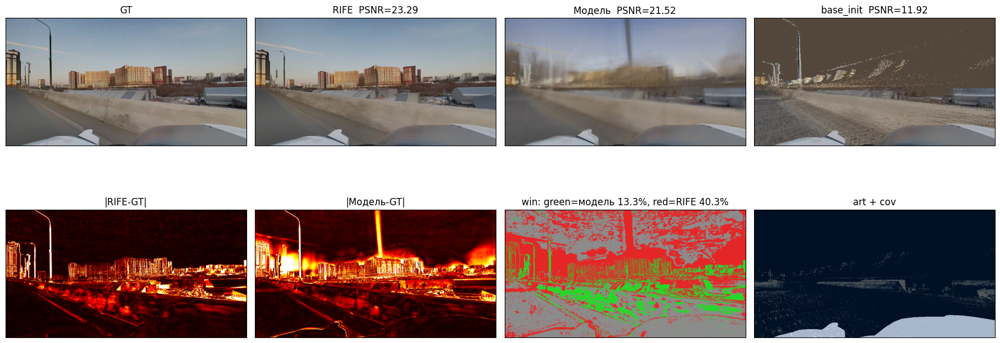

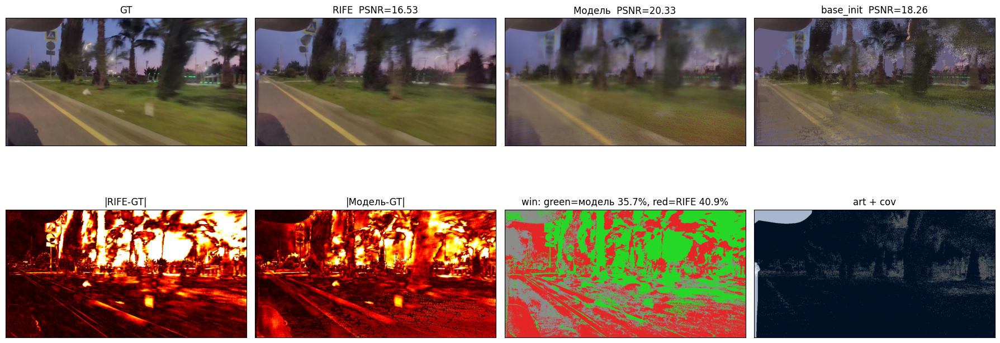

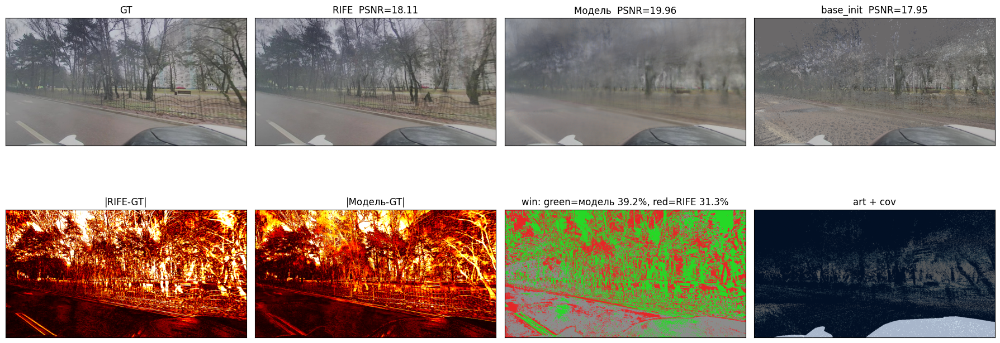

In [14]:
def to_numpy_img(t):
    if t.dim() == 4:
        t = t[0]
    if t.size(0) == 1:
        return t.cpu().numpy()[0]
    return t.detach().cpu().permute(1, 2, 0).clamp(0, 1).numpy()


@torch.no_grad()
def visualize_sample(model, batch, device, use_amp=True, amp_dtype=torch.bfloat16):
    model.eval()
    inputs   = batch["inputs"].to(device)
    eff_mask = batch["effective_mask"].to(device)
    base     = batch["base_init"].to(device)
    gt       = batch["target"].to(device)
    with torch.autocast(device_type=device.type, dtype=amp_dtype, enabled=use_amp):
        out = model(inputs, eff_mask, base)
    pred = out["pred"].float()
    warp_rgb = inputs[:, 0:3]
    coverage = inputs[:, 3:4]
    depth    = inputs[:, 4:5]
    sf_rgb   = inputs[:, 5:8]
    sf_mask  = inputs[:, 8:9]
    art_mask = inputs[:, 9:10]
    mean_t0t1 = inputs[:, 10:13] if inputs.size(1) >= 13 else None

    err = (pred - gt).abs().mean(dim=1, keepdim=True)

    psnr = psnr_uint8(pred, gt)
    psnr_warp = psnr_uint8(warp_rgb, gt)
    psnr_base = psnr_uint8(base, gt)

    fig, axes = plt.subplots(3, 3, figsize=(15, 9))
    axes[0,0].imshow(to_numpy_img(gt));        axes[0,0].set_title("Target (GT)")
    axes[0,1].imshow(to_numpy_img(warp_rgb));  axes[0,1].set_title(f"Raw warp  PSNR={psnr_warp:.2f}")
    axes[0,2].imshow(to_numpy_img(base));      axes[0,2].set_title(f"Base init  PSNR={psnr_base:.2f}")

    axes[1,0].imshow(to_numpy_img(pred));      axes[1,0].set_title(f"Prediction  PSNR={psnr:.2f}")
    axes[1,1].imshow(to_numpy_img(coverage), cmap="viridis", vmin=0, vmax=1)
    axes[1,1].set_title("Coverage")
    axes[1,2].imshow(to_numpy_img(sf_rgb));    axes[1,2].set_title("Static far")
    if not CFG.use_static_far:
        axes[1, 2].imshow(to_numpy_img(art_mask), cmap="gray", vmin=0, vmax=1)
        axes[1, 2].set_title("Artifact mask")

    axes[2,0].imshow(to_numpy_img(err), cmap="hot", vmin=0, vmax=0.2)
    axes[2,0].set_title("|pred-gt| (channel mean)")
    axes[2,1].imshow(to_numpy_img(depth), cmap="plasma")
    axes[2,1].set_title("Depth (norm)")
    if mean_t0t1 is not None:
        axes[2, 2].imshow(to_numpy_img(mean_t0t1))
        axes[2, 2].set_title("mean*(1-art)")
    else:
        axes[2, 2].imshow(to_numpy_img(art_mask), cmap="gray", vmin=0, vmax=1)
        axes[2, 2].set_title("Artifact mask")

    for ax in axes.flat:
        ax.set_xticks([]); ax.set_yticks([])
    plt.tight_layout()
    plt.show()
    return {"psnr": psnr, "psnr_warp": psnr_warp, "psnr_base": psnr_base}


def _err_map(pred, gt):
    return (pred - gt).abs().mean(dim=1)[0].cpu().numpy()


def load_trained_model(ckpt_path, cfg=None, use_ema=True):
    cfg = cfg or CFG
    model = ConsensusUNet(in_ch=cfg.in_channels, base=cfg.base_channels)
    ckpt = torch.load(ckpt_path, map_location=DEVICE, weights_only=False)
    state = ckpt.get("ema") if use_ema and ckpt.get("ema") else ckpt["model"]
    model.load_state_dict(state)
    return model.to(DEVICE).eval()


@torch.no_grad()
def visualize_compare_rife_model(model, batch, device, idx=0, use_amp=True, amp_dtype=torch.bfloat16):
    model.eval()
    inputs = batch["inputs"].to(device)
    eff_mask = batch["effective_mask"].to(device)
    base = batch["base_init"].to(device)
    gt = batch["target"].to(device)
    with torch.autocast(device_type=device.type, dtype=amp_dtype, enabled=use_amp):
        pred = model(inputs, eff_mask, base)["pred"].float()
    i = idx
    gt_i, pred_i, base_i = gt[i:i+1], pred[i:i+1], base[i:i+1]
    warp_i = inputs[i:i+1, 0:3]
    cov_i, art_i = inputs[i:i+1, 3:4], inputs[i:i+1, 9:10]
    rife_i = batch["rife_rgb"][i:i+1].to(device) if "rife_rgb" in batch else None
    m = {"model": psnr_uint8(pred_i, gt_i), "warp": psnr_uint8(warp_i, gt_i), "base": psnr_uint8(base_i, gt_i)}
    if rife_i is not None and rife_i.abs().sum() > 1e-6:
        m["rife"] = psnr_uint8(rife_i, gt_i)
    err_model = _err_map(pred_i, gt_i)
    err_rife = _err_map(rife_i, gt_i) if rife_i is not None else None
    fig, axes = plt.subplots(2, 4, figsize=(18, 8))
    axes[0,0].imshow(to_numpy_img(gt_i)); axes[0,0].set_title("GT")
    if rife_i is not None:
        axes[0,1].imshow(to_numpy_img(rife_i)); axes[0,1].set_title(f"RIFE  PSNR={m.get('rife',0):.2f}")
    else:
        axes[0,1].imshow(to_numpy_img(warp_i)); axes[0,1].set_title(f"warp  PSNR={m['warp']:.2f}")
    axes[0,2].imshow(to_numpy_img(pred_i)); axes[0,2].set_title(f"Модель  PSNR={m['model']:.2f}")
    axes[0,3].imshow(to_numpy_img(base_i)); axes[0,3].set_title(f"base_init  PSNR={m['base']:.2f}")
    if err_rife is not None:
        axes[1,0].imshow(err_rife, cmap="hot", vmin=0, vmax=0.25); axes[1,0].set_title("|RIFE-GT|")
        win = np.full(err_model.shape+(3,), 0.55)
        mb, rb = err_rife > err_model+0.01, err_model > err_rife+0.01
        win[mb], win[rb] = [0.15,0.85,0.15], [0.9,0.15,0.15]
        axes[1,2].imshow(win); axes[1,2].set_title(f"win: green=модель {100*mb.mean():.1f}%, red=RIFE {100*rb.mean():.1f}%")
    else:
        axes[1,0].imshow(_err_map(warp_i, gt_i), cmap="hot", vmin=0, vmax=0.25); axes[1,0].set_title("|warp-GT|")
        axes[1,2].axis("off")
    axes[1,1].imshow(err_model, cmap="hot", vmin=0, vmax=0.25); axes[1,1].set_title("|Модель-GT|")
    axes[1,3].imshow(to_numpy_img(art_i), cmap="gray", vmin=0, vmax=1); axes[1,3].set_title("art + cov")
    axes[1,3].imshow(to_numpy_img(cov_i), cmap="Blues", alpha=0.35, vmin=0, vmax=1)
    for ax in axes.flat: ax.set_xticks([]); ax.set_yticks([])
    plt.tight_layout(); plt.show()
    return m


def demo_compare_on_val(ckpt_path=None, n_samples=3, tag=None):
    tag = tag or CFG.checkpoint_tag
    samples = ALL_SAMPLES if len(ALL_SAMPLES) else discover_samples(CFG)
    _, val_paths = make_split(samples, CFG.val_fraction, CFG.seed)
    val_ds = ConsensusDataset(val_paths, CFG, patch_size=None, augment=False)
    val_loader = DataLoader(val_ds, batch_size=1, shuffle=False, num_workers=0)
    print_baselines(measure_baselines(val_loader, DEVICE), title="Val baselines")
    if ckpt_path is None: ckpt_path = Path(CFG.save_dir) / f"{tag}_best.pt"
    ckpt_path = Path(ckpt_path)
    if not ckpt_path.is_file():
        print(f"Чекпоинт не найден: {ckpt_path}"); return
    model = load_trained_model(ckpt_path)
    ckpt = torch.load(ckpt_path, map_location="cpu", weights_only=False)
    vp = ckpt.get("val_psnr_ema", ckpt.get("val_psnr"))
    print(f"Загружен {ckpt_path.name}  val_psnr={vp:.3f} dB\n" if isinstance(vp,(int,float)) else f"Загружен {ckpt_path.name}\n")
    for j, batch in enumerate(val_loader):
        visualize_compare_rife_model(model, batch, DEVICE)
        if j + 1 >= n_samples: break

demo_compare_on_val()  # или demo_compare_on_val(baseline_result["best_ckpt"])

## 14. Альтернатива: ConsensusMARNet — SPADE-модуляция

Идея — вместо PartialConv поднимаем модель за счёт **модальной фьюзии**:
- два **shared** энкодера: один прогоняет `warp_rgb`, другой `static_far_rgb`;
- на каждом масштабе **SPADE-модуляция** признаков по карте мета-инфы
  (`coverage`, `depth`, `static_far_mask`, `artifact_mask`) — депф/маски
  предсказывают γ и β для нормализации RGB-фич;
- две RGB-ветки сливаются через `Conv2d(2C → C)` на каждом масштабе;
- декодер обычный, residual поверх `base_init` с zero-init.

Эту архитектуру можно сравнить с `ConsensusUNet` на одном валид-сплите.

In [ ]:
class SPADE(nn.Module):
    # γ, β из meta-карты модулируют нормированные RGB-фичи. zero-init → identity.
    def __init__(self, rgb_ch, meta_ch, mid_ch=None):
        super().__init__()
        mid_ch = mid_ch or max(rgb_ch // 2, 16)
        self.norm = nn.GroupNorm(num_groups=min(8, rgb_ch), num_channels=rgb_ch, affine=False)
        self.shared = nn.Sequential(
            nn.Conv2d(meta_ch, mid_ch, 3, padding=1),
            nn.ReLU(inplace=True),
        )
        self.to_gamma = nn.Conv2d(mid_ch, rgb_ch, 3, padding=1)
        self.to_beta  = nn.Conv2d(mid_ch, rgb_ch, 3, padding=1)
        nn.init.zeros_(self.to_gamma.weight); nn.init.zeros_(self.to_gamma.bias)
        nn.init.zeros_(self.to_beta.weight);  nn.init.zeros_(self.to_beta.bias)

    def forward(self, rgb_feat, meta_feat):
        if meta_feat.shape[-2:] != rgb_feat.shape[-2:]:
            meta_feat = F.interpolate(meta_feat, size=rgb_feat.shape[-2:],
                                      mode="bilinear", align_corners=False)
        h = self.shared(meta_feat)
        gamma = self.to_gamma(h); beta = self.to_beta(h)
        return self.norm(rgb_feat) * (1.0 + gamma) + beta


class FrameEncoder(nn.Module):
    # 4-уровневый encoder, возвращает фичи на 4 масштабах
    def __init__(self, in_ch, base):
        super().__init__()
        self.b0 = ConvBlock(in_ch, base)
        self.b1 = ConvBlock(base, base * 2)
        self.b2 = ConvBlock(base * 2, base * 4)
        self.b3 = ConvBlock(base * 4, base * 8)
        self.pool = nn.MaxPool2d(2)

    def forward(self, x):
        f0 = self.b0(x)
        f1 = self.b1(self.pool(f0))
        f2 = self.b2(self.pool(f1))
        f3 = self.b3(self.pool(f2))
        return [f0, f1, f2, f3]


class ConsensusMARNet(nn.Module):
    def __init__(self, base=32, meta_base=16, in_channels=13):
        super().__init__()
        self.in_channels = in_channels
        self.n_rgb_branches = 3 if in_channels >= 13 else 2
        self.rgb_ch  = [base, base * 2, base * 4, base * 8]
        self.meta_ch = [meta_base, meta_base * 2, meta_base * 4, meta_base * 8]

        self.rgb_enc  = FrameEncoder(in_ch=3, base=base)
        self.meta_enc = FrameEncoder(in_ch=4, base=meta_base)

        self.spades = nn.ModuleList([
            SPADE(self.rgb_ch[s], self.meta_ch[s]) for s in range(4)
        ])
        self.fuse = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(self.n_rgb_branches * self.rgb_ch[s], self.rgb_ch[s], 3, padding=1),
                nn.GELU(),
                nn.Conv2d(self.rgb_ch[s], self.rgb_ch[s], 3, padding=1),
                nn.GELU(),
            ) for s in range(4)
        ])

        self.up   = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False)
        self.dec3 = ConvBlock(self.rgb_ch[3] + self.rgb_ch[2], self.rgb_ch[2])
        self.dec2 = ConvBlock(self.rgb_ch[2] + self.rgb_ch[1], self.rgb_ch[1])
        self.dec1 = ConvBlock(self.rgb_ch[1] + self.rgb_ch[0], self.rgb_ch[0])

        self.out_residual = nn.Conv2d(self.rgb_ch[0], 3, 3, padding=1)
        nn.init.zeros_(self.out_residual.weight)
        nn.init.zeros_(self.out_residual.bias)

    def _split(self, x):
        warp     = x[:, 0:3]
        coverage = x[:, 3:4]
        depth    = x[:, 4:5]
        sf_rgb   = x[:, 5:8]
        sf_mask  = x[:, 8:9]
        art_mask = x[:, 9:10]
        meta = torch.cat([coverage, depth, sf_mask, art_mask], dim=1)
        anchors = []
        if x.size(1) >= 13:
            anchors = [x[:, 10:13]]
        return warp, sf_rgb, meta, anchors

    def forward(self, x, eff_mask, base_init):
        warp_rgb, sf_rgb, meta, anchors = self._split(x)
        rgb_inputs = [warp_rgb, sf_rgb] + anchors

        all_feats = [self.rgb_enc(ri) for ri in rgb_inputs]
        meta_feats = self.meta_enc(meta)

        merged = []
        for s in range(4):
            mods = [self.spades[s](all_feats[i][s], meta_feats[s]) for i in range(len(rgb_inputs))]
            merged.append(self.fuse[s](torch.cat(mods, dim=1)))

        d3 = merged[3]
        d2 = self.dec3(torch.cat([self.up(d3), merged[2]], dim=1))
        d1 = self.dec2(torch.cat([self.up(d2), merged[1]], dim=1))
        d0 = self.dec1(torch.cat([self.up(d1), merged[0]], dim=1))

        residual = self.out_residual(d0)
        pred = (base_init + residual).clamp(0, 1)
        return {"pred": pred, "residual": residual}


def consensus_marnet_sanity():
    m = ConsensusMARNet(base=32, meta_base=16, in_channels=CFG.in_channels)
    x = torch.randn(2, CFG.in_channels, 256, 256)
    mask = (torch.rand(2, 1, 256, 256) > 0.2).float()
    base = torch.rand(2, 3, 256, 256)
    out = m(x, mask, base)
    n = sum(p.numel() for p in m.parameters())
    print(f"ConsensusMARNet параметров: {n/1e6:.2f}M")
    print(f"  pred: {tuple(out['pred'].shape)}")
    diff = (out["pred"] - base.clamp(0,1)).abs().max().item()
    print(f"  |pred - base|_max при zero-init: {diff:.6f}  (должно быть ~0)")

consensus_marnet_sanity()


def run_baseline_marnet(num_epochs=200):
    return run_training(
        lambda cfg: ConsensusMARNet(base=cfg.base_channels, in_channels=cfg.in_channels),
        num_epochs=num_epochs,
        tag="consensus_marnet_side",
    )


# Запуск MARNet (нужны ячейки run_training + класс выше)
# marnet_result = run_baseline_marnet(num_epochs=200)

### Сравнение архитектур

```python
def run_arch_comparison(num_epochs=100):
    samples = ALL_SAMPLES if len(ALL_SAMPLES) else discover_samples(CFG)
    train_paths, val_paths = make_split(samples, CFG.val_fraction, CFG.seed)
    train_ds = ConsensusDataset(train_paths, CFG, patch_size=CFG.patch_size, augment=True)
    val_ds   = ConsensusDataset(val_paths,   CFG, patch_size=None,           augment=False)
    train_loader, val_loader = make_dataloaders(train_ds, val_ds, CFG)
    print_baselines(measure_baselines(val_loader, DEVICE))

    cfg = Config(**{**CFG.__dict__, "num_epochs": num_epochs})
    results = {}
    for name, ctor in [
        ("unet_pconv", lambda: ConsensusUNet(in_ch=cfg.in_channels, base=cfg.base_channels)),
        ("marnet",     lambda: ConsensusMARNet(base=cfg.base_channels, in_channels=cfg.in_channels)),
    ]:
        print(f"\n=== {name} ===")
        results[name] = train_one_run(ctor(), train_loader, val_loader, cfg, tag=name)

    print("\n=== ИТОГ ===")
    for name, r in results.items():
        print(f"  {name}: best PSNR = {r['best_psnr']:.3f} dB")
    return results

# results = run_arch_comparison(num_epochs=100)
```

## 15. Ablations / следующие шаги

**Что попробовать в первую очередь:**

1. **Residual gate** — `pred = base + residual * (1 - coverage)`: модель вообще
   не трогает уверенные пиксели. Часто +0.2-0.5 dB на восстановлении дырок без
   просадки на покрытых.
2. **Loss weighting** — `loss_weight_hole = 2.0 ... 3.0` чтобы модель сильнее
   училась восполнять дырки. Следи, чтобы не страдал PSNR на видимых пикселях.
3. **Анизотропный блюр в inference** в направлении ego-motion
   (см. precompute с `compute_per_pixel_motion`) — даёт +0.1-0.3 dB за счёт
   смещения распределения ошибки к минимуму MSE.
4. **Patch curriculum** — старт с patch=128, потом 256, потом 384.

**Что НЕ нужно:**
- Никаких цветовых аугментаций (портит target-RGB, вредит PSNR).
- Не подавать RIFE на вход — мы специально от него ушли, чтобы не учить ошибки.
- L1 как основной лосс — для PSNR-метрики MSE строго лучше.

**Полезные проверки:**
- `print_baselines(measure_baselines(val_loader, DEVICE))` — warp, RIFE, mean raw/masked, base_init.
- `demo_compare_on_val(baseline_result["best_ckpt"])` — картинки RIFE vs модель + win-map.
  Если `base_init >> warp_only`, static_far / mean дают буст уже на старте.
- Sanity overfit ≥ 40 dB на 8 сэмплах — capacity OK.
- Если `train_psnr ≈ val_psnr` на полном датасете — недообучение, увеличивай
  `base_channels` или тренируй дольше.